In [1]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import proplot as pplt
import seaborn as sns
import pandas as pd
import torch
import gymnasium as gym
import gym_bart
import itertools
from umap import UMAP
from plotting_utils import (
    set_rc, 
    add_abc_to_subaxes, 
    colors, 
    rgb_colors
)
from model_evaluation import (
    forced_action_evaluate, 
    meta_bart_callback,
    meta_bart_multi_callback,
    reshape_parallel_evalu_res,
    forced_action_evaluate_multi,
)
from bart_behavior_analysis import (
    plot_1color5fsize,
    plot_1colornfsize
)
from read_experiments import average_runs, load_exp_df
import re

from functools import partial
import sys
sys.path.append('../')
from ppo.envs import make_vec_env
import pickle
from tqdm import tqdm
from collections import defaultdict
from pathlib import Path

from bart_representation_analysis import *
from bart_compress_visualize_decode import *
from sklearn.decomposition import PCA
from scipy.stats import ttest_ind

set_rc()

In [2]:
give_rew = ['', 'giverew_']
postfixes = ['', 'pop0.05', 'pop0.1', 'pop0.2']
models = [1.0, 1.2, 1.5, 1.7, 2.0]
trials = range(3)
chks = np.arange(10, 243, 30)

give_labels = ['Rew not shown', 'Rew shown']
pop_labels = ['0', '-0.05', '-0.1', '-0.2']
pop_vals = [0, -0.05, -0.1, -0.2]
p_labels = ['1.0',' 1.2', '1.5', '1.7', '2.0']
chk_labels = [str(c) for c in chks]
chk_axis = 'Checkpoint'
pop_axis = 'Punishment on pop'
p_axis = 'p'

iterators = [give_rew, postfixes, models, trials, chks]
# iterators = [postfixes, models, trials, chks]
iterators_idxs = [range(len(i)) for i in iterators]
sizes = [len(i) for i in iterators]

res = pickle.load(open('data/meta_representation_results', 'rb'))

In [3]:
np.array(list(res.keys()))

array(['last_sizes', 'unpopped_sizes', 'pop_rate', 'rewards', 'values',
       'action_probs', 'all_lens', 'all_num_balloons', 'dec_flow_scores',
       'iterators_idxs', 'sizes', 'ramp_f1s', 'ramp_indiv_contribs',
       'confidence_scores', 'unconfidence_scores', 'unconfident_points',
       'step_count', 'all_decision_nodes', 'cluster_regressor_coefs',
       'cluster_regressor_scores', 'cluster_ks', 'pca_regressor_coefs',
       'pca_regressor_scores'], dtype='<U24')

In [4]:
model_idx, model, obs_rms, r = select_random_model(1, load_models=True)

c:\Users\14and\anaconda3\envs\bart\lib\site-packages\gymnasium\core.py:311: UserWarning: WARN: env.balloon_mean_sizes to get variables from other wrappers is deprecated and will be removed in v1.0, to get this variable you can do `env.unwrapped.balloon_mean_sizes` for environment variables or `env.get_wrapper_attr('balloon_mean_sizes')` that will search the reminding wrappers.
  logger.warn(


# Number of clusters

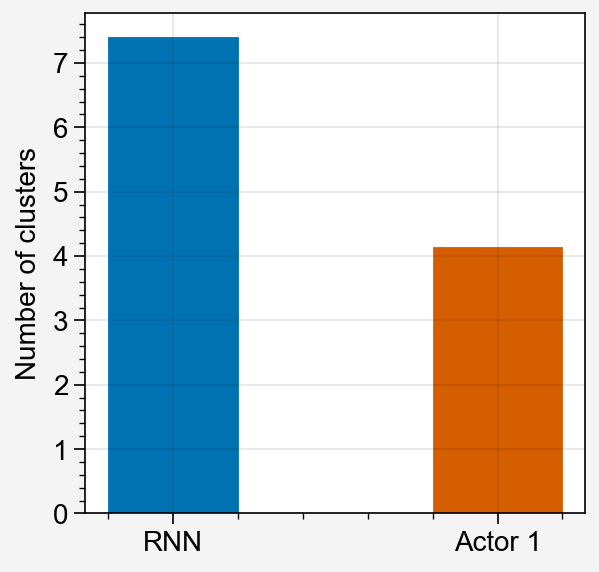

In [12]:
rnn_ks = res['cluster_ks'][:, :, :, :, :, 1]
actor0_ks = res['cluster_ks'][:, :, :, :, :, 2]

rnn_ks = select_idxs(rnn_ks, 'first')
actor0_ks = select_idxs(actor0_ks, 'first')

fig, ax = pplt.subplots()
ax.bar(0, rnn_ks.mean())
ax.bar(1, actor0_ks.mean())
ax.format(xlocator=range(2), xformatter=['RNN', 'Actor 1'], ylabel='Number of clusters')

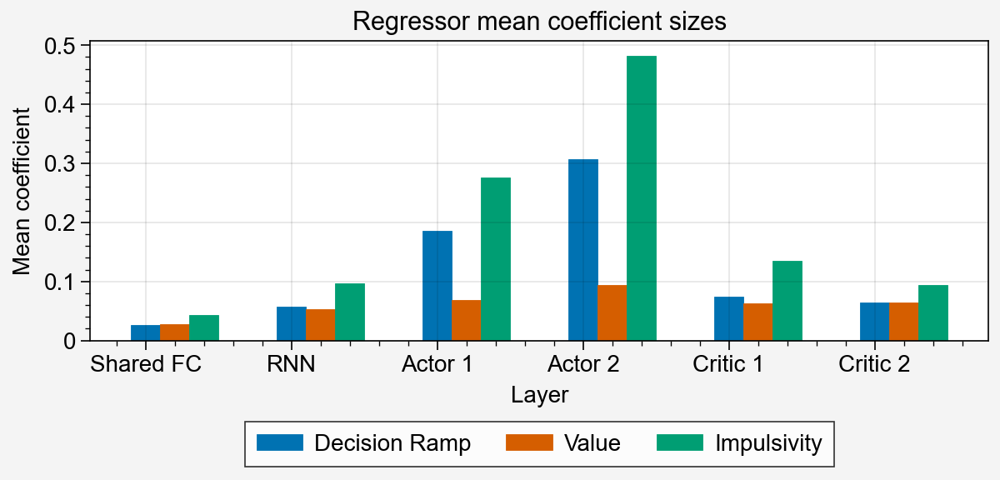

In [55]:
idxs = pickle.load(open('data/meta_representation_first_idxs', 'rb'))
coef_labels = ['Decision Ramp', 'Value', 'Impulsivity']

coefs = []
for i in range(6):
    coefs.append([])
    for j in range(3):
        coefs[i].append([])
        
for n in range(2*4*5*3):
    idx = np.unravel_index(n, (2, 4, 5, 3))
    idx = tuple(idx) + (idxs[idx],)
    
    for layer in range(6):
        k = int(res['cluster_ks'][idx][layer])
        for m in range(3):
            coefs[layer][m].append(res['cluster_regressor_coefs'][idx][layer][m][:k].mean())

fig, ax = pplt.subplots(refaspect=3, figwidth=6)
coefs = np.abs(np.array(coefs)).mean(axis=-1)

for m in range(3):
    ax.bar(np.arange(6)+0.2*m, coefs[:, m], label=coef_labels[m], width=0.2)

ax.legend(loc='b')
ax.format(xlabel='Layer', xlocator=range(6), 
          xformatter=['Shared FC', 'RNN', 'Actor 1', 'Actor 2', 'Critic 1', 'Critic 2'],
          ylabel='Mean coefficient', title='Regressor mean coefficient sizes')


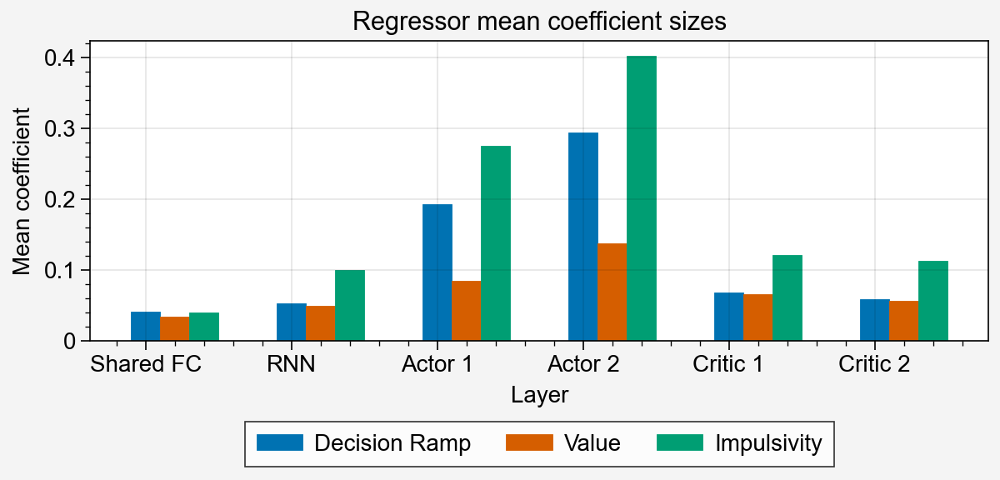

In [57]:
idxs = pickle.load(open('data/meta_representation_first_idxs', 'rb'))
coef_labels = ['Decision Ramp', 'Value', 'Impulsivity']

coefs = []
for i in range(6):
    coefs.append([])
    for j in range(3):
        coefs[i].append([])
        
for n in range(2*4*5*3):
    idx = np.unravel_index(n, (2, 4, 5, 3))
    idx = tuple(idx) + (idxs[idx],)
    
    for layer in range(6):
        k = int(res['cluster_ks'][idx][layer])
        for m in range(3):
            coefs[layer][m].append(res['pca_regressor_coefs'][idx][layer][m][:k].mean())

fig, ax = pplt.subplots(refaspect=3, figwidth=6)
coefs = np.abs(np.array(coefs)).mean(axis=-1)

for m in range(3):
    ax.bar(np.arange(6)+0.2*m, coefs[:, m], label=coef_labels[m], width=0.2)

ax.legend(loc='b')
ax.format(xlabel='Layer', xlocator=range(6), 
          xformatter=['Shared FC', 'RNN', 'Actor 1', 'Actor 2', 'Critic 1', 'Critic 2'],
          ylabel='Mean coefficient', title='Regressor mean coefficient sizes')


# Studying how to characterize decaying value

In [148]:
model_idxs[0]

(1, 0, 3, 0, 1)

In [150]:
h, i, j, k, l = model_idxs[0]
model, obs_rms = metabart_model_load(h, i, j, k, l)
r = evalu(model, obs_rms, True)

c:\Users\14and\anaconda3\envs\bart\lib\site-packages\gymnasium\core.py:311: UserWarning: WARN: env.balloon_mean_sizes to get variables from other wrappers is deprecated and will be removed in v1.0, to get this variable you can do `env.unwrapped.balloon_mean_sizes` for environment variables or `env.get_wrapper_attr('balloon_mean_sizes')` that will search the reminding wrappers.
  logger.warn(


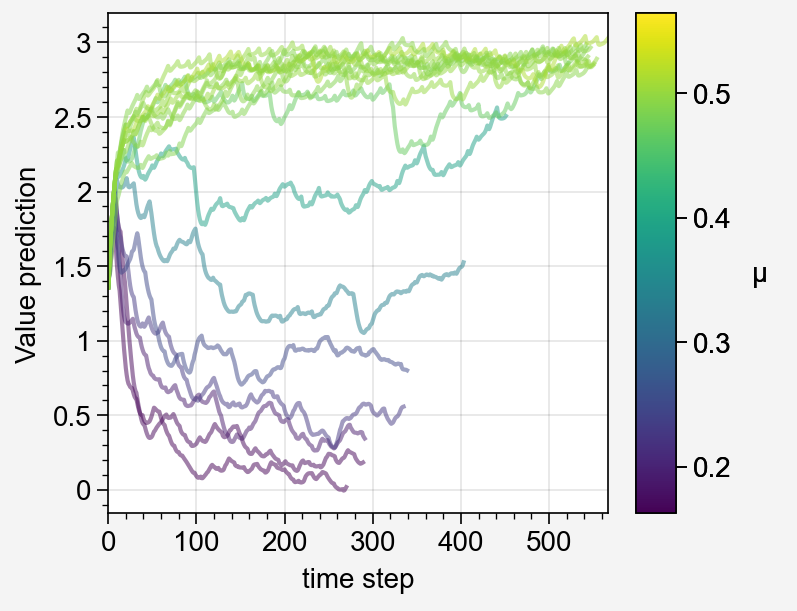

In [65]:
r = rs[0]
visualize_episode_values(r)

(Figure(nrows=4, ncols=5, figwidth=7.0),
 SubplotGrid(nrows=4, ncols=5, length=20))

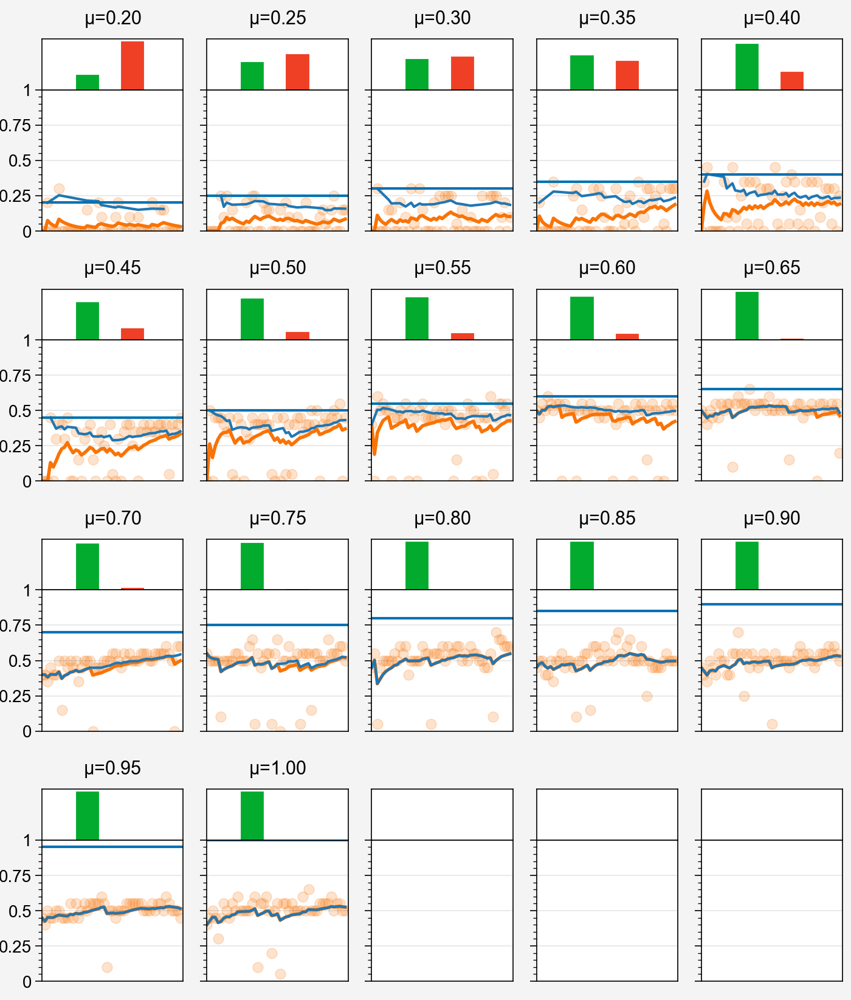

In [66]:
plot_1colornfsize(r)

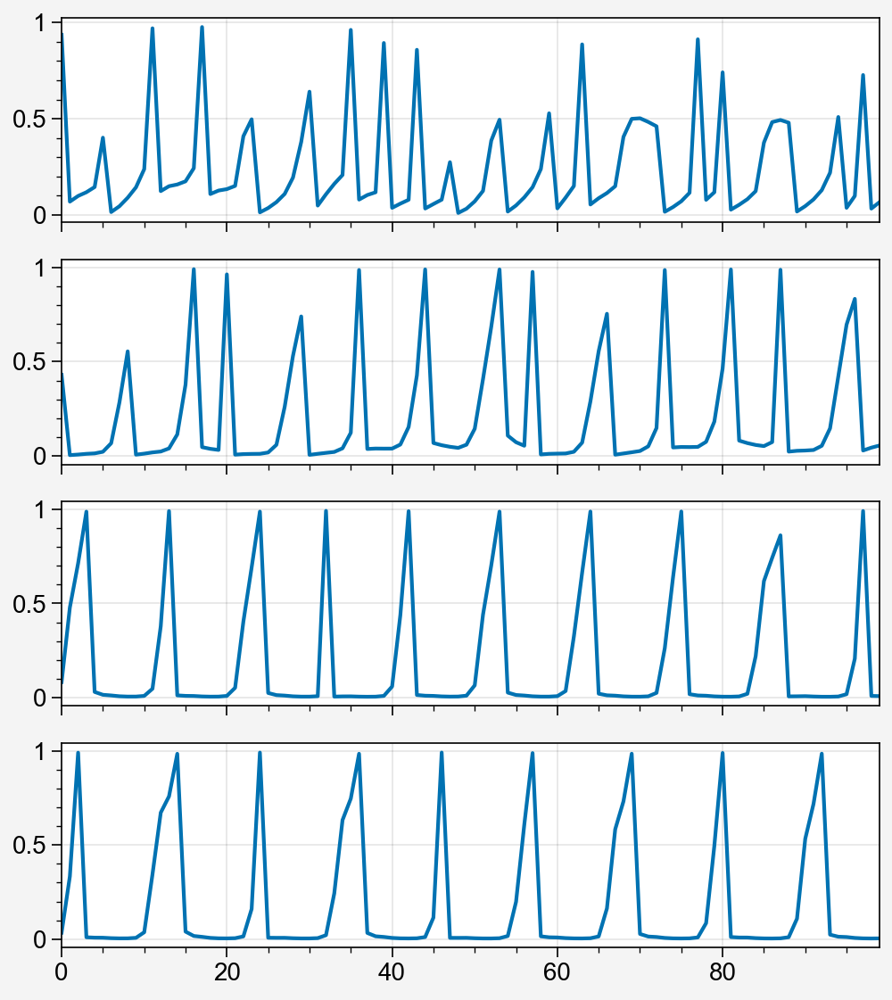

In [90]:
eps = [1, 5, 10, 15]
fig, ax = pplt.subplots(nrows=4, refaspect=4, figwidth=5)
for i, ep in enumerate(eps):
    ap = r['action_probs'][ep][:, 1]
    ax[i].plot(ap[100:200])

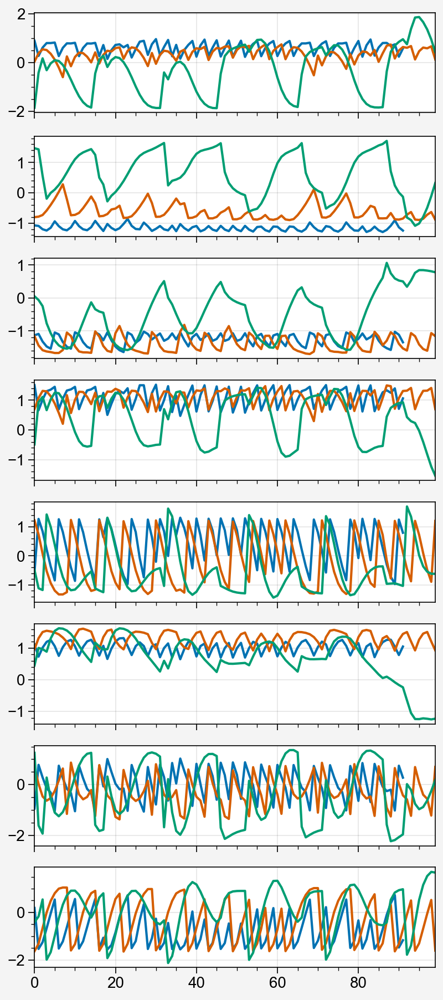

In [99]:
eps = [1, 5, 10]
fig, ax = pplt.subplots(nrows=k, refaspect=4, figwidth=4)
for i, ep in enumerate(eps):
    for j in range(k):
        ap = r['action_probs'][ep][:, 1]
        # ax[j].plot(ap[100:200], alpha=0.3)
        ax[j].plot(ep_cluster_norm[ep][100:200, j])

In [98]:
r = rs[1]

layer = 'shared1'
actions = np.vstack(r['actions'])

k = find_k_cluster_activations(r, layer=layer, require_ap_explained=True)
print(k)
cluster_activ, labels, kmeans = get_cluster_activations(r, layer=layer, k=k)
scaler = TimeSeriesScalerMeanVariance()
cluster_norm = scaler.fit_transform(cluster_activ[:, :, np.newaxis])
cluster_norm = cluster_norm.reshape(cluster_activ.shape)

ep_cluster_norm = split_by_ep(r, cluster_norm)

8


In [103]:
layer = 'shared1'
actions = np.vstack(r['actions'])

k = find_k_cluster_activations(r, layer=layer, require_ap_explained=True)
cluster_activ, labels, kmeans = get_cluster_activations(r, layer=layer, k=k)
scaler = TimeSeriesScalerMeanVariance()
cluster_norm = scaler.fit_transform(cluster_activ[:, :, np.newaxis])
cluster_norm = cluster_norm.reshape(cluster_activ.shape)

# cluster_activ = np.vstack(comb_pca(r, n_components=6, layer=layer))
# scaler = TimeSeriesScalerMeanVariance()
# cluster_norm = scaler.fit_transform(cluster_activ[:, :, np.newaxis])
# cluster_norm = cluster_norm.reshape(cluster_activ.shape)


act_model = LogisticRegression(penalty='l1', solver='liblinear', C=1)
# act_model = LogisticRegression()
act_model.fit(cluster_norm, actions)
ypred = act_model.predict(cluster_norm)
act_score = f1_score(actions.reshape(-1), ypred)
act_coef = act_model.coef_[0]

print(act_coef, act_score)

[-3.55989788 -3.77920175  3.25457684  4.52189112 -2.6823497   0.
  1.58991305  0.        ] 0.5727466288147622


c:\Users\14and\anaconda3\envs\bart\lib\site-packages\sklearn\utils\validation.py:1229: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [75]:
res['cluster_regressor_scores'][idx][1]

array([0.        , 0.73073261, 0.33116118])

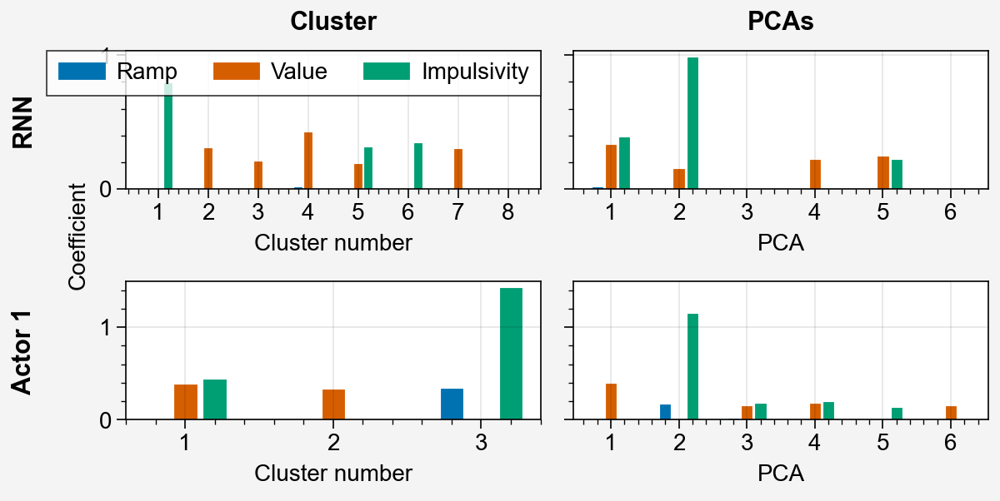

In [101]:
fig, ax = pplt.subplots(ncols=2, nrows=2, refaspect=3, figwidth=6, sharex=False)

idx = model_idxs[1]
layers = [1, 2]
layer_labels = ['RNN', 'Actor 1']

for i, layer in enumerate(layers):
    nclusters = int(res['cluster_ks'][idx][layer])
    coefs = res['cluster_regressor_coefs'][idx][layer][:, :nclusters]
    legend = False if i == 1 else True
    visualize_regressor_coefficients(coefs, ax=ax[i, 0], legend=legend)
    
    coefs = res['pca_regressor_coefs'][idx][layer]
    visualize_regressor_coefficients(coefs, False, ax=ax[i, 1], legend=False)
    
ax.format(leftlabels=layer_labels, toplabels=['Cluster', 'PCAs'],
          title='')

In [19]:
h = 0
i = 1
j = 2
t = 1

idxs = pickle.load(open('data/meta_representation_first_idxs', 'rb'))

chk = idxs[h, i, j, t]
idx = (h, i, j, t, chk)

model, obs_rms = metabart_model_load(h, i, j, t, chk)
r = evalu(model, obs_rms)
# Indexing of regressors: [6, 3]: [layer, (ramp, value, impulsivity)]

c:\Users\14and\anaconda3\envs\bart\lib\site-packages\gymnasium\core.py:311: UserWarning: WARN: env.balloon_mean_sizes to get variables from other wrappers is deprecated and will be removed in v1.0, to get this variable you can do `env.unwrapped.balloon_mean_sizes` for environment variables or `env.get_wrapper_attr('balloon_mean_sizes')` that will search the reminding wrappers.
  logger.warn(


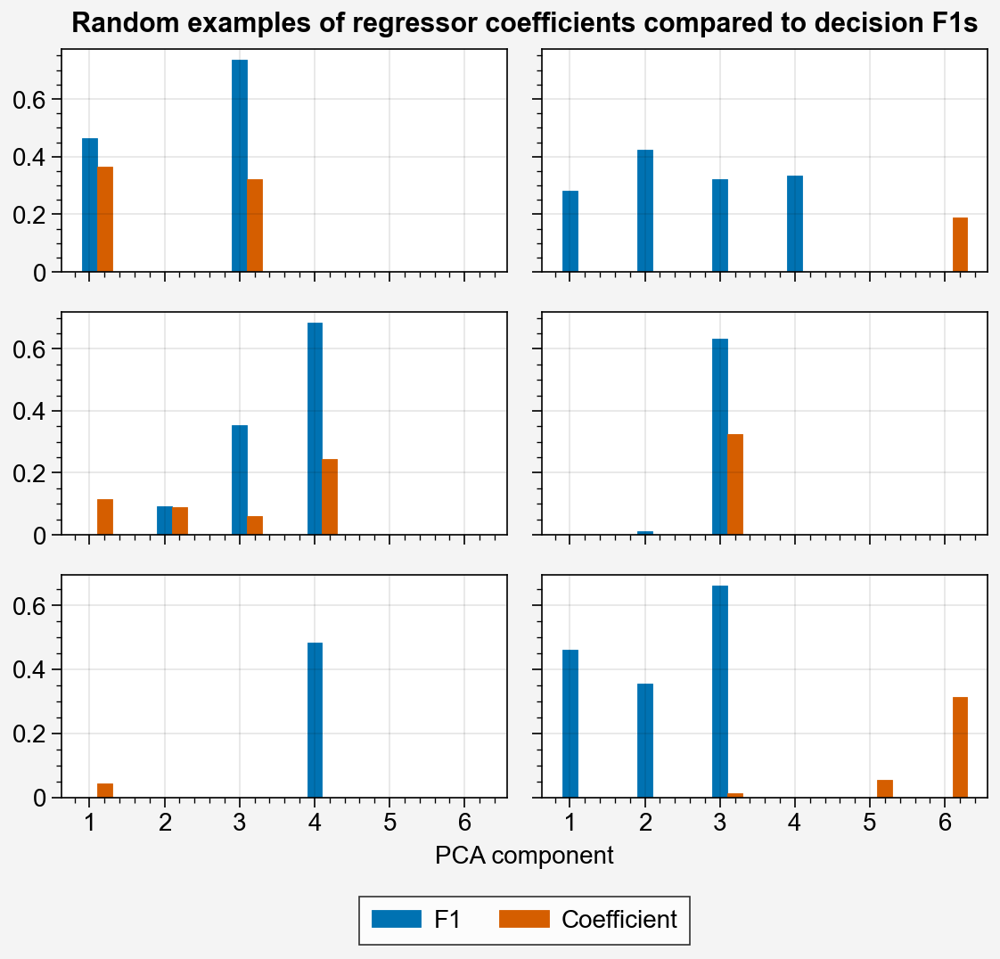

In [139]:
fig, ax = pplt.subplots(nrows=3, ncols=2, refaspect=2)

layer = 1
idxs = select_random_model(6)
for i, idx in enumerate(idxs):
    bars = []
    decision_f1s = res['ramp_f1s'][idx][layer][1:7]
    decision_coefs = np.abs(res['pca_regressor_coefs'][idx][1][0])
    bars.append(ax[i].bar(np.arange(6), decision_f1s, width=0.2, label='F1'))
    bars.append(ax[i].bar(np.arange(6)+0.2, decision_coefs, width=0.2, label='Coefficient'))

ax.format(suptitle='Random examples of regressor coefficients compared to decision F1s', 
          xlocator=range(6), xformatter=[str(i) for i in range(1, 7)],
          xlabel='PCA component')
fig.legend(bars, loc='b')

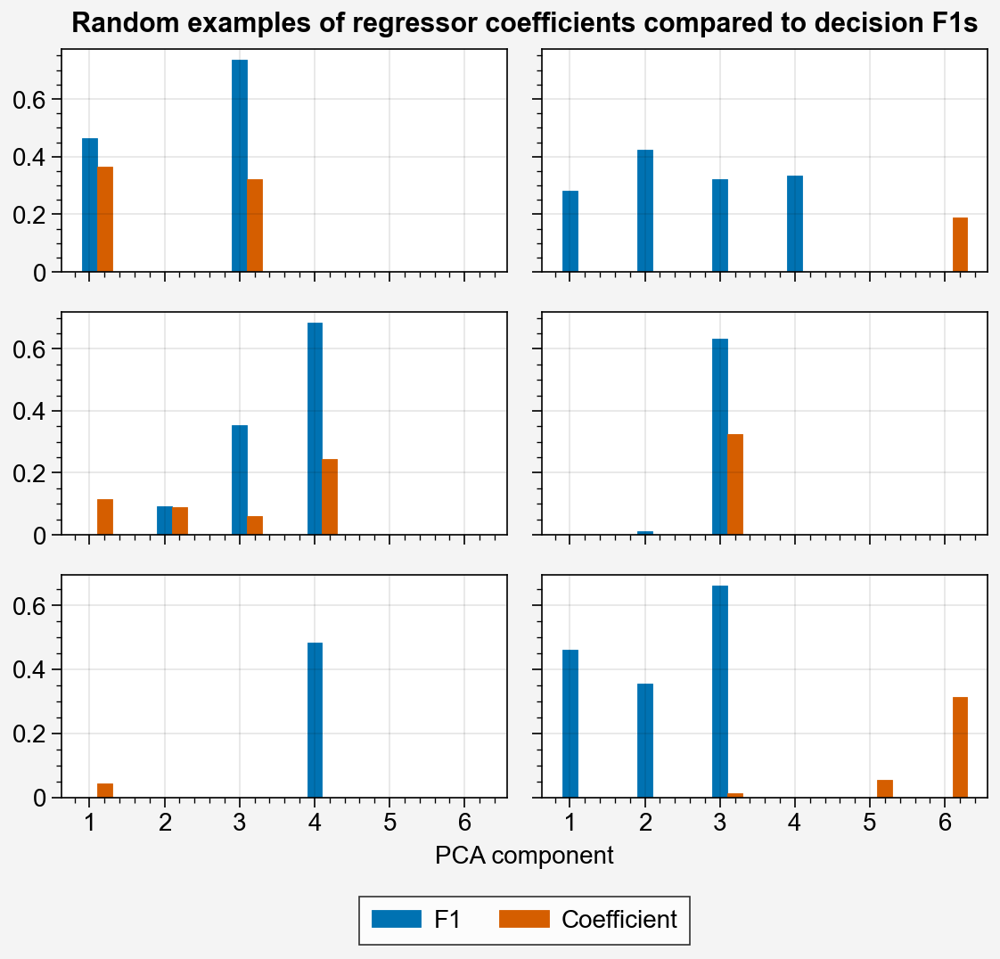

In [ ]:
fig, ax = pplt.subplots(nrows=3, ncols=2, refaspect=2)

layer = 1
idxs = select_random_model(6)
for i, idx in enumerate(idxs):
    bars = []
    decision_f1s = res['ramp_f1s'][idx][layer][1:7]
    decision_coefs = np.abs(res['pca_regressor_coefs'][idx][1][0])
    bars.append(ax[i].bar(np.arange(6), decision_f1s, width=0.2, label='F1'))
    bars.append(ax[i].bar(np.arange(6)+0.2, decision_coefs, width=0.2, label='Coefficient'))

ax.format(suptitle='Random examples of regressor coefficients compared to decision F1s', 
          xlocator=range(6), xformatter=[str(i) for i in range(1, 7)],
          xlabel='PCA component')
fig.legend(bars, loc='b')

In [152]:
h, i,  j, t, chk = idxs[5]
model, obs_rms = metabart_model_load(h, i, j, t, chk)
r = evalu(model, obs_rms)

c:\Users\14and\anaconda3\envs\bart\lib\site-packages\gymnasium\core.py:311: UserWarning: WARN: env.balloon_mean_sizes to get variables from other wrappers is deprecated and will be removed in v1.0, to get this variable you can do `env.unwrapped.balloon_mean_sizes` for environment variables or `env.get_wrapper_attr('balloon_mean_sizes')` that will search the reminding wrappers.
  logger.warn(


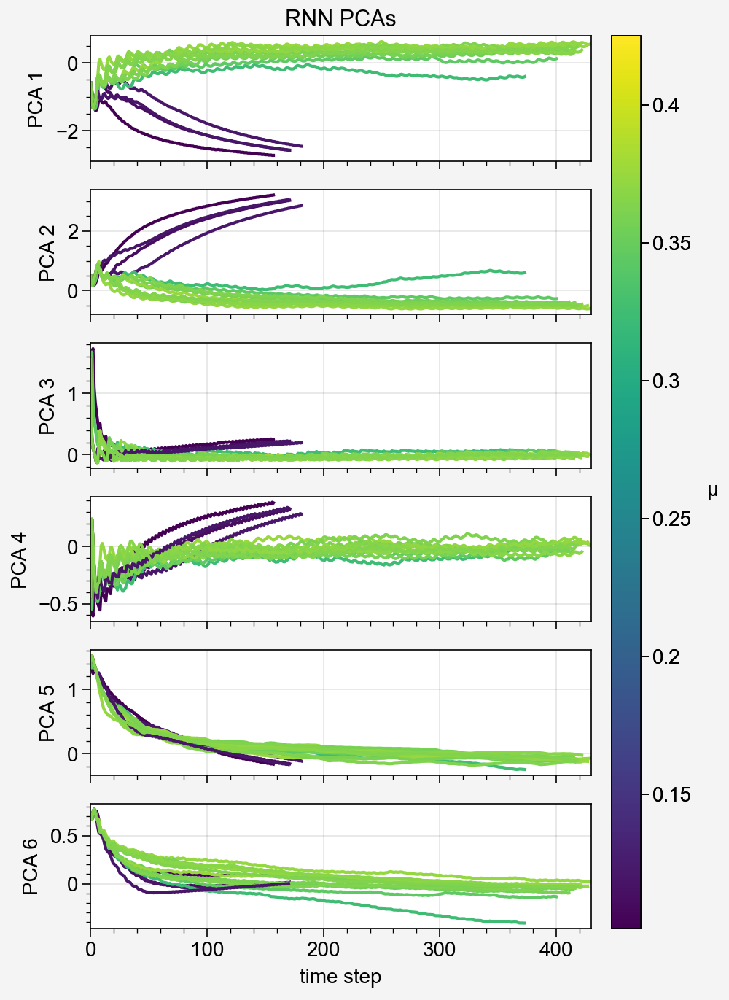

In [154]:
visualize_smoothed_pca_episodes(r, n_components=6)

Within-cluster connectivity z-scores:
[-0.68113115 -0.07992888  2.3110359  -0.5695233  -0.2225564   0.13471199
 -0.89260816]

Between-cluster connectivity z-scores:
[[ 0.44928828 -0.47625964  0.05533883 -1.06917399 -0.52642694 -0.4855862
  -0.70971485]
 [-0.4532483  -0.07509447  1.95210621 -1.29256342  0.25354983  0.71434184
  -1.86284421]
 [ 1.97652901  2.10656014 -0.8014502   1.02622285  2.07455163  2.00291835
   0.77574659]
 [-0.94690347 -0.75188286 -0.91937068  1.39759193 -0.79904332 -0.72946146
  -0.1155144 ]
 [ 0.05718381  0.05574278  0.26279043  0.28092378 -0.08090624  0.05809886
   0.21009097]
 [ 0.23312734  0.40488589  0.58513777  0.5503052   0.34070416 -0.28545149
   0.17360478]
 [-1.31597666 -1.26395184 -1.13455236 -0.89330636 -1.26242913 -1.27485991
   1.52863112]]


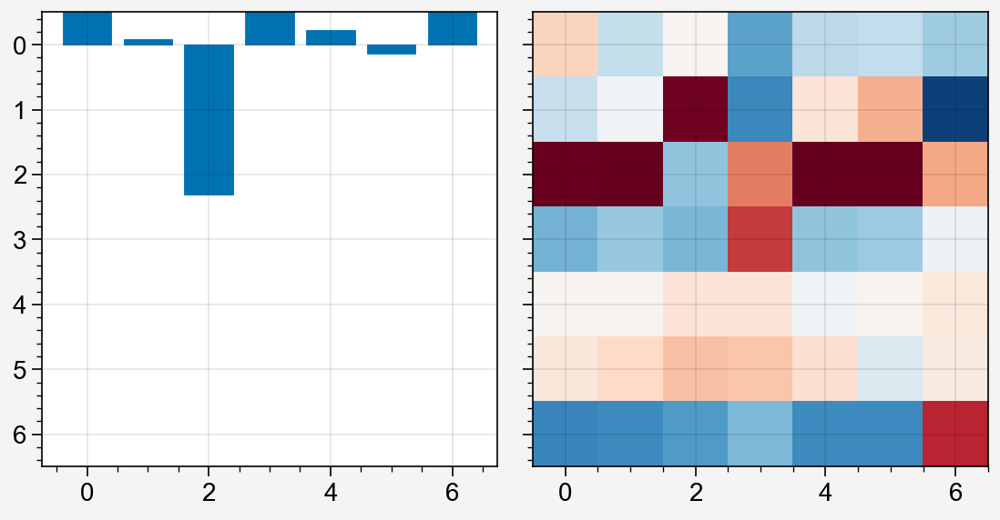

In [187]:
layer = 'shared1'
k = find_k_cluster_activations(r, layer=layer)
cluster_activ, labels, kmeans = get_cluster_activations(r, layer=layer, k=k)
params = list(model.base.gru.parameters())
labels = np.random.permutation(labels)

import numpy as np
from scipy.stats import zscore

# Get weight matrices from params (assuming GRU has only one layer for simplicity)
params = [p.detach().numpy() for  p in params]
weight_ih, weight_hh, bias_ih, bias_hh = params

# Number of clusters
num_clusters = len(np.unique(labels))

# Initialize connectivity counts for observed data
within_cluster_count = np.zeros(num_clusters)
between_cluster_count = np.zeros((num_clusters, num_clusters))

# Observed connectivity calculation
for i in range(64):
    for j in range(64):
        if i == j:
            continue
        cluster_i = labels[i]
        cluster_j = labels[j]
        # Sum weights across all gates (i.e., input, reset, and output gate connections)
        connection_strength = np.sum(np.abs(weight_hh[:, i] * weight_hh[:, j]))
        if cluster_i == cluster_j:
            within_cluster_count[cluster_i] += connection_strength
        else:
            between_cluster_count[cluster_i, cluster_j] += connection_strength

# Random connectivity distribution
random_within_cluster_counts = []
random_between_cluster_counts = []

for _ in range(100):  # 1000 shuffles for random baseline
    shuffled_labels = np.random.permutation(labels)
    shuffled_within_cluster_count = np.zeros(num_clusters)
    shuffled_between_cluster_count = np.zeros((num_clusters, num_clusters))

    for i in range(64):
        for j in range(64):
            if i == j:
                continue
            cluster_i = shuffled_labels[i]
            cluster_j = shuffled_labels[j]
            connection_strength = np.sum(np.abs(weight_hh[:, i] * weight_hh[:, j]))
            if cluster_i == cluster_j:
                shuffled_within_cluster_count[cluster_i] += connection_strength
            else:
                shuffled_between_cluster_count[cluster_i, cluster_j] += connection_strength

    random_within_cluster_counts.append(shuffled_within_cluster_count)
    random_between_cluster_counts.append(shuffled_between_cluster_count)

# Convert random distributions to arrays
random_within_cluster_counts = np.array(random_within_cluster_counts)
random_between_cluster_counts = np.array(random_between_cluster_counts)

# Calculate z-scores for observed vs. random distributions
within_cluster_z_scores = zscore(within_cluster_count - random_within_cluster_counts.mean(axis=0))
between_cluster_z_scores = zscore(between_cluster_count - random_between_cluster_counts.mean(axis=0))

# Print results for inspection
print("Within-cluster connectivity z-scores:")
print(within_cluster_z_scores)
print("\nBetween-cluster connectivity z-scores:")
print(between_cluster_z_scores)

fig, ax = pplt.subplots(ncols=2)
ax[0].bar(within_cluster_z_scores)
ax[1].imshow(between_cluster_z_scores, vmin=-2, vmax=2)


(array([ 9., 17.,  0., 13.,  0.,  5.,  7.,  0.,  7.,  6.]),
 array([0. , 0.6, 1.2, 1.8, 2.4, 3. , 3.6, 4.2, 4.8, 5.4, 6. ]),
 <BarContainer object of 10 artists>)

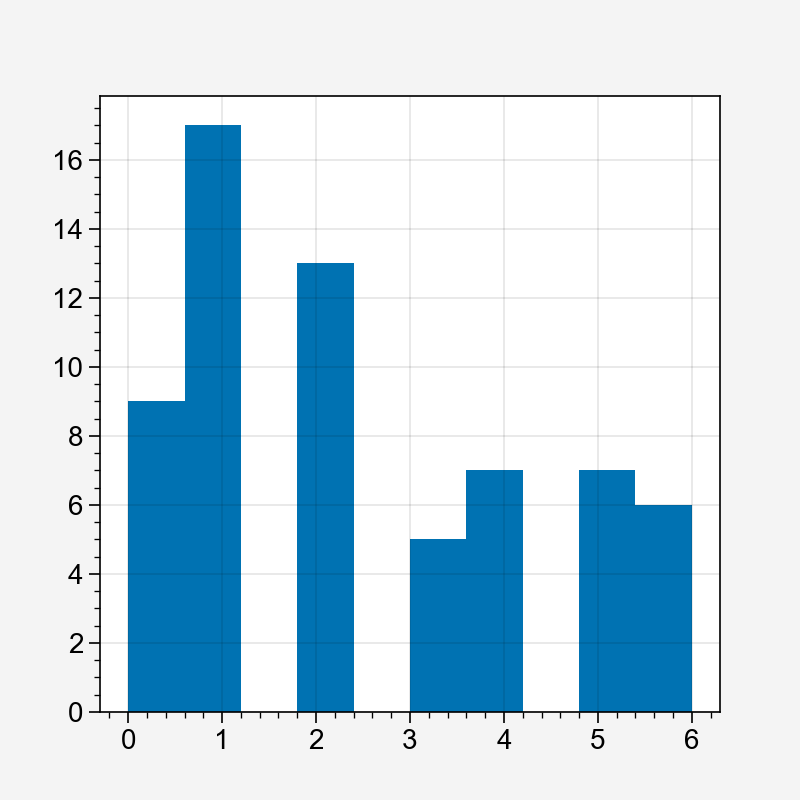

In [188]:
plt.hist(labels)

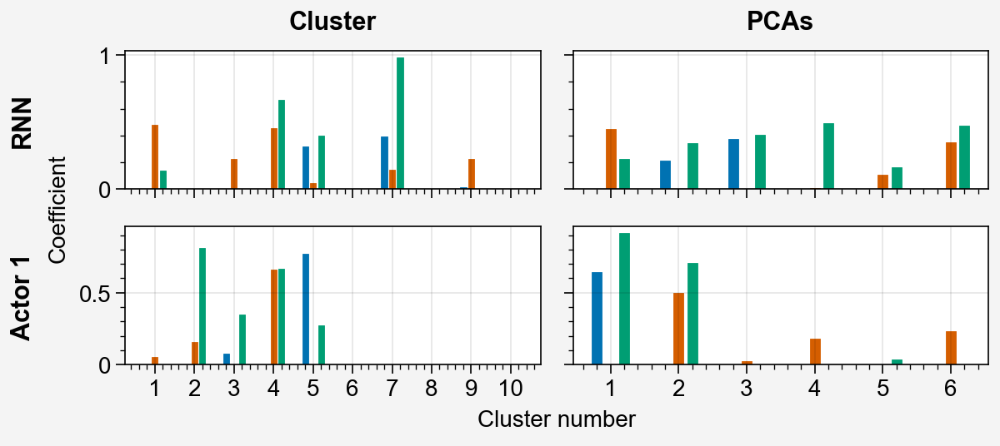

In [83]:
fig, ax = pplt.subplots(ncols=2, nrows=2, refaspect=3, figwidth=6)

layers = [1, 2]
layer_labels = ['RNN', 'Actor 1']

for i, layer in enumerate(layers):
    nclusters = int(res['cluster_ks'][idx][layer])
    coefs = res['cluster_regressor_coefs'][idx][layer][:, :nclusters]
    visualize_regressor_coefficients(coefs, ax=ax[i, 0], legend=False)
    
    coefs = res['pca_regressor_coefs'][idx][layer]
    visualize_regressor_coefficients(coefs, False, ax=ax[i, 1], legend=False)
    
ax.format(leftlabels=layer_labels, toplabels=['Cluster', 'PCAs'],
          title='')

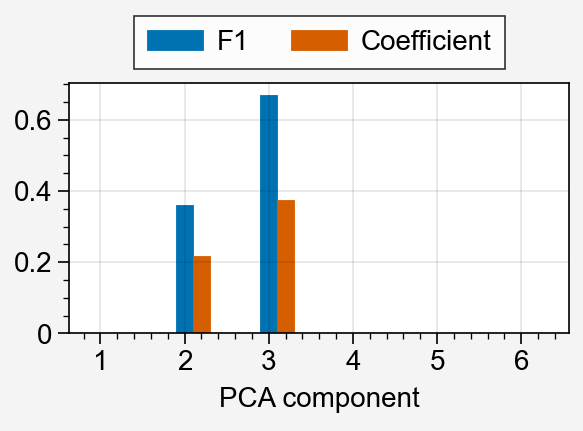

In [108]:
fig, ax = pplt.subplots(refaspect=2)

layer = 1

decision_f1s = res['ramp_f1s'][idx][layer][1:7]
decision_coefs = res['pca_regressor_coefs'][idx][1][0]
ax.bar(np.arange(6), decision_f1s, width=0.2, label='F1')
ax.bar(np.arange(6)+0.2, decision_coefs, width=0.2, label='Coefficient')
ax.legend(loc='t')
ax.format(xlocator=range(6), xformatter=[str(i) for i in range(1, 7)],
          xlabel='PCA component')

In [23]:
np.round(res['cluster_regressor_scores'][idx], 4)

array([[0.    , 0.224 , 0.    ],
       [0.5384, 0.9169, 0.7316],
       [0.5976, 0.7587, 0.8161],
       [0.    , 0.1156, 0.7595],
       [0.    , 0.7803, 0.5654],
       [0.6072, 0.9225, 0.756 ]])

In [24]:
np.round(res['pca_regressor_scores'][idx], 4)

array([[0.    , 0.2276, 0.    ],
       [0.    , 0.795 , 0.5601],
       [0.643 , 0.7644, 0.7675],
       [0.7337, 0.842 , 0.9098],
       [0.    , 0.8034, 0.5661],
       [0.2662, 0.8607, 0.6014]])

In [34]:
layer = 1
nclusters = int(res['cluster_ks'][idx][layer])
np.round(res['cluster_regressor_coefs'][idx], 4)[layer][:, :nclusters]

array([[ 0.    ,  0.    ,  0.    ,  0.    , -0.3202,  0.    ,  0.3924,
         0.    ,  0.0145,  0.    ],
       [-0.4789,  0.    ,  0.2244,  0.4533,  0.0454, -0.    , -0.146 ,
        -0.    ,  0.2252, -0.    ],
       [ 0.1415,  0.    , -0.    , -0.663 , -0.3992,  0.    ,  0.9806,
        -0.    ,  0.    , -0.    ]])

In [74]:
layer = 'shared1'
actions = np.vstack(r['actions'])

# k = find_k_cluster_activations(r, layer=layer)
# cluster_activ, labels, kmeans = get_cluster_activations(r, layer=layer, k=k)
# scaler = TimeSeriesScalerMeanVariance()
# cluster_norm = scaler.fit_transform(cluster_activ[:, :, np.newaxis])
# cluster_norm = cluster_norm.reshape(cluster_activ.shape)

cluster_activ = np.vstack(comb_pca(r, n_components=6, layer=layer))
scaler = TimeSeriesScalerMeanVariance()
cluster_norm = scaler.fit_transform(cluster_activ[:, :, np.newaxis])
cluster_norm = cluster_norm.reshape(cluster_activ.shape)


act_model = LogisticRegression(penalty='l1', solver='liblinear', C=0.0012)
act_model.fit(cluster_norm, actions)
ypred = act_model.predict(cluster_norm)
act_score = f1_score(actions.reshape(-1), ypred)
act_coef = act_model.coef_[0]

print(act_coef, act_score)

[0.         0.31702897 0.54177553 0.         0.         0.        ] 0.5015806111696522


c:\Users\14and\anaconda3\envs\bart\lib\site-packages\sklearn\utils\validation.py:1229: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [62]:
cluster_activ = np.vstack(comb_pca(r, n_components=6, layer=layer))
# act_model = LogisticRegression(penalty='l1', solver='liblinear', C=0.1)
act_model = LogisticRegression()
act_model.fit(cluster_norm[:, 0].reshape(-1, 1), actions)
ypred = act_model.predict(cluster_norm[:, 0].reshape(-1, 1))
act_score = f1_score(actions.reshape(-1), ypred)
act_coef = act_model.coef_[0]


c:\Users\14and\anaconda3\envs\bart\lib\site-packages\sklearn\utils\validation.py:1229: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [63]:
act_score

0.0

In [69]:
pca_as = comb_pca(r, layer)
pcas = np.vstack(pca_as)
activ = np.vstack(r['activations'][layer])

j = 3
lm = LogisticRegression()
lm.fit(pcas[:, j].reshape(-1, 1), actions)
ypred = lm.predict(pcas[:, j].reshape(-1, 1))
score = f1_score(actions.reshape(-1), ypred)
score

c:\Users\14and\anaconda3\envs\bart\lib\site-packages\sklearn\utils\validation.py:1229: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


0.0

# Testing cluster connectivity

In [ ]:
layer = 'shared1'
k = find_k_cluster_activations(r, layer=layer)
cluster_activ, labels, kmeans = get_cluster_activations(r, layer=layer, k=k)
params = list(model.base.gru.parameters())

hidden_size = 64

# Extract the hidden-to-hidden weights for the 'new' gate in the GRU
weight_hh_l0 = params[1].detach().cpu().numpy()  # Convert to NumPy array
weight_hh_new = weight_hh_l0[2*hidden_size:3*hidden_size, :]  # Shape: [64, 64]

# Convert 'labels' to a NumPy array if it isn't already
labels = np.array(labels)

# Create a boolean matrix indicating whether each pair of nodes is in the same cluster
same_cluster = labels[:, np.newaxis] == labels[np.newaxis, :]

# Get the weights corresponding to within-cluster and between-cluster connections
weights_within = weight_hh_new[same_cluster]
weights_between = weight_hh_new[~same_cluster]

# Compute the mean absolute weights for within-cluster and between-cluster connections
mean_within = np.mean(np.abs(weights_within))
mean_between = np.mean(np.abs(weights_between))

print(f"Mean absolute weight within clusters: {mean_within}")
print(f"Mean absolute weight between clusters: {mean_between}")

# Perform a permutation test to assess statistical significance
num_permutations = 1000
diffs = []
for _ in range(num_permutations):
    permuted_labels = np.random.permutation(labels)
    perm_same_cluster = permuted_labels[:, np.newaxis] == permuted_labels[np.newaxis, :]
    perm_weights_within = weight_hh_new[perm_same_cluster]
    perm_weights_between = weight_hh_new[~perm_same_cluster]
    perm_mean_within = np.mean(np.abs(perm_weights_within))
    perm_mean_between = np.mean(np.abs(perm_weights_between))
    diffs.append(perm_mean_within - perm_mean_between)

# Compute the observed difference
observed_diff = mean_within - mean_between

# Calculate the p-value
p_value = np.mean(np.array(diffs) >= observed_diff)

print(f"Observed difference: {observed_diff}")
print(f"P-value: {p_value}")

Mean absolute weight within clusters: 0.0884203240275383
Mean absolute weight between clusters: 0.078593909740448
Observed difference: 0.009826414287090302
P-value: 0.01


In [111]:
t = 1
chk = 240
exp_name = f"giverew_rnn_p1.5n50pop0.05"
model, (obs_rms, ret_rms) = \
    torch.load(f'../saved_checkpoints/meta_v2/{exp_name}_{t}/{chk}.pt')
r = evalu(model, obs_rms, True)

c:\Users\14and\anaconda3\envs\bart\lib\site-packages\gymnasium\core.py:311: UserWarning: WARN: env.balloon_mean_sizes to get variables from other wrappers is deprecated and will be removed in v1.0, to get this variable you can do `env.unwrapped.balloon_mean_sizes` for environment variables or `env.get_wrapper_attr('balloon_mean_sizes')` that will search the reminding wrappers.
  logger.warn(


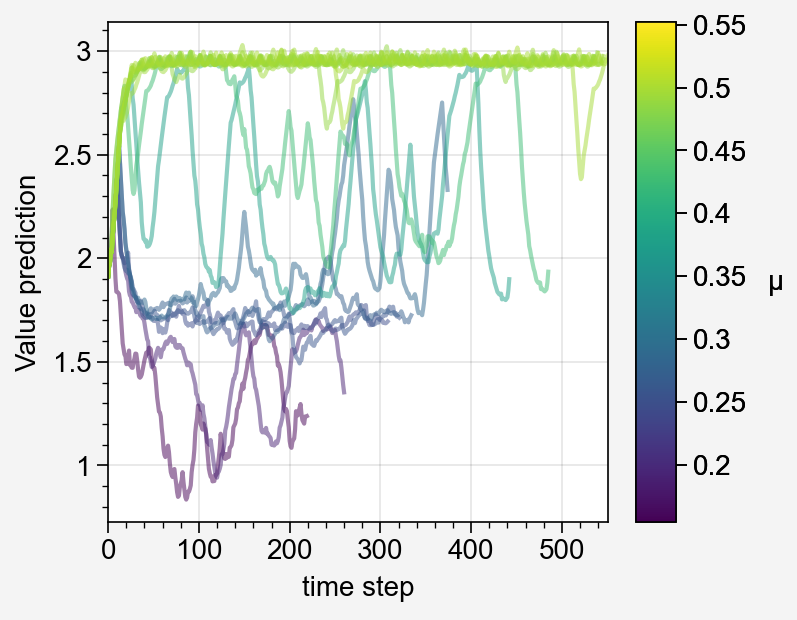

In [112]:
visualize_episode_values(r)

(Figure(nrows=4, ncols=5, figwidth=7.0),
 SubplotGrid(nrows=4, ncols=5, length=20))

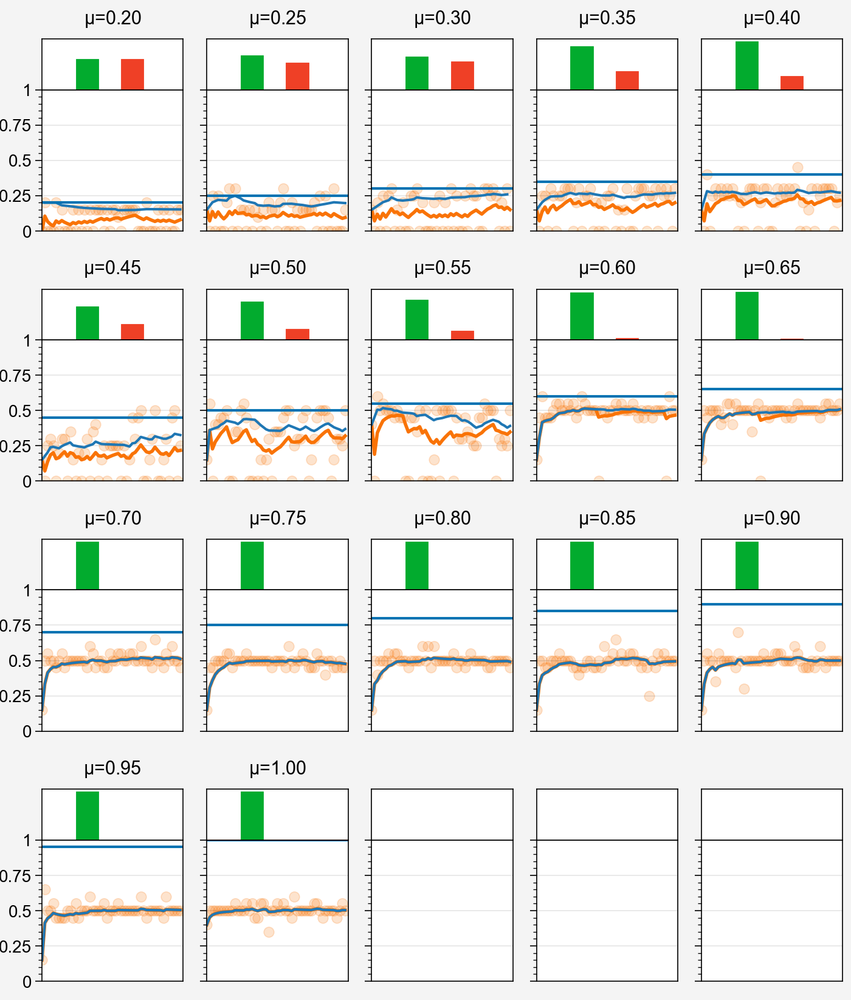

In [113]:
plot_1colornfsize(r)

In [134]:
layer = 'shared1'
actions = np.vstack(r['actions'])

k = find_k_cluster_activations(r, layer=layer, require_ap_explained=True)
cluster_activ, labels, kmeans = get_cluster_activations(r, layer=layer, k=k)
scaler = TimeSeriesScalerMeanVariance()
cluster_norm = scaler.fit_transform(cluster_activ[:, :, np.newaxis])
cluster_norm = cluster_norm.reshape(cluster_activ.shape)

# cluster_activ = np.vstack(comb_pca(r, n_components=6, layer=layer))
# scaler = TimeSeriesScalerMeanVariance()
# cluster_norm = scaler.fit_transform(cluster_activ[:, :, np.newaxis])
# cluster_norm = cluster_norm.reshape(cluster_activ.shape)


act_model = LogisticRegression(penalty='l1', solver='liblinear', C=1)
# act_model = LogisticRegression()
act_model.fit(cluster_norm, actions)
ypred = act_model.predict(cluster_norm)
act_score = f1_score(actions.reshape(-1), ypred)
act_coef = act_model.coef_[0]

print(act_coef, act_score)

[0.         0.04222747] 0.0


c:\Users\14and\anaconda3\envs\bart\lib\site-packages\sklearn\utils\validation.py:1229: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [116]:
imp = get_impulsivity_data(r, layer='shared1', load_global=False)
activ = imp['activ']
ap = imp['ap'].reshape(-1, 1)

lr = LinearRegression()
lr.fit(cluster_norm, ap)
ypred = lr.predict(cluster_norm)
print(r2_score(ap, ypred))

0.81648710814738


In [118]:
compute_regressor_coefficients(r)

c:\Users\14and\anaconda3\envs\bart\lib\site-packages\sklearn\utils\validation.py:1229: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


(array([[ 0.00000000e+00,  0.00000000e+00],
        [-2.33742413e-01,  0.00000000e+00],
        [-1.44437529e+00,  1.76082107e-15]]),
 array([0.        , 0.16579706, 0.43381687]))

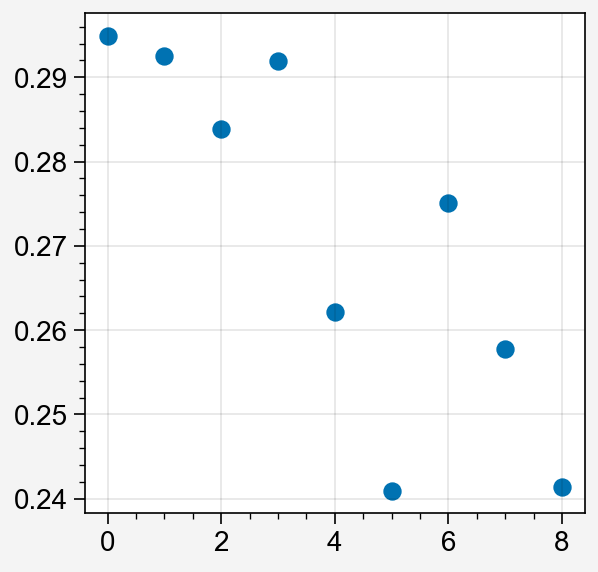

In [245]:

imp = get_impulsivity_data(r, layer='shared1', load_global=False)
activ = imp['activ']
ap = imp['ap'].reshape(-1, 1)
data = activ.T  # change to [64, T]
scaler = TimeSeriesScalerMeanVariance()
data_normalized = scaler.fit_transform(data[:, :, np.newaxis])  # Shape becomes [64, T, 1]
data_normalized = data_normalized.squeeze()  # Back to shape [64, T]

max_k = 10  # Maximum number of clusters to try
silhouette_scores = []
r2_scores = []
ks = range(2, max_k + 1)

lr = LinearRegression()
lr.fit(activ, ap)
ypred = lr.predict(activ)
best_r2 = r2_score(ap, ypred)

for k in ks:
    kmeans = KMeans(n_clusters=k, random_state=0)
    labels = kmeans.fit_predict(data_normalized)
    silhouette_avg = silhouette_score(data_normalized, labels)
    silhouette_scores.append(silhouette_avg)

    # Test how good the cluster compression explains behavior
    cluster_activations, _, _ = get_cluster_activations(r, layer, kmeans)
    lr = LinearRegression()
    lr.fit(cluster_activations, ap)
    ypred = lr.predict(cluster_activations)
    r2_scores.append(r2_score(ap, ypred))
fig, ax = pplt.subplots()
ax.scatter(silhouette_scores)

In [369]:


def kmeans_oriented_activations(res, layer='shared1', require_ap_explained=True):
    '''
    Perform k-means but also flip activations to allow for reversed activations to cluster
    together. Automatically determine the appropriate orientations of each nodes activity
    according to which orientation has better clustering
    '''
    imp = get_impulsivity_data(res, layer=layer, load_global=False)
    activ = imp['activ']
    combactiv = np.hstack([activ, -activ])
    data = combactiv.T
    scaler = TimeSeriesScalerMeanVariance()
    data_normalized = scaler.fit_transform(data[:, :, np.newaxis])  # Shape becomes [64, T, 1]
    data_normalized = data_normalized.squeeze()  # Back to shape [64, T]


    max_k = 20  # Maximum number of clusters to try
    silhouette_scores = []
    r2_scores = []
    ks = range(2, max_k + 1)

    lr = LinearRegression()
    lr.fit(activ, ap)
    ypred = lr.predict(activ)
    best_r2 = r2_score(ap, ypred)

    for k in ks:
        kmeans = KMeans(n_clusters=k, random_state=0)
        labels = kmeans.fit_predict(data_normalized)
        silhouette_avg = silhouette_score(data_normalized, labels)
        silhouette_scores.append(silhouette_avg)

        # Test how good the cluster compression explains behavior
        cluster_activations, _, _ = get_cluster_activations(r, layer, kmeans)
        lr = LinearRegression()
        lr.fit(cluster_activations, ap)
        ypred = lr.predict(cluster_activations)
        r2_scores.append(r2_score(ap, ypred))
    r2_scores = np.array(r2_scores)
    silhouette_scores = np.array(silhouette_scores)
    
    # Ensure that enough info is kept in clusters to keep r2 prediction high
    if require_ap_explained:
        min_r2_idx = np.argmax(r2_scores > 0.7*best_r2)
        best_k = np.argmax(silhouette_scores[min_r2_idx:]) + min_r2_idx + 2
    else:
        best_k = np.argmax(silhouette_scores) + 2
    
    # Orient activations
    cluster_activ, labels, kmeans = get_cluster_activations(r, layer, k=best_k)
    orientation = []
    labels = []
    for i in range(64):
        right_dist = np.linalg.norm(kmeans.cluster_centers_ - activ[:, i], axis=1)
        left_dist = np.linalg.norm(kmeans.cluster_centers_ + activ[:, i], axis=1)

        if right_dist.min() < left_dist.min():
            orientation.append(1)
            labels.append(np.argmin(right_dist))
        else:
            orientation.append(-1)
            labels.append(np.argmin(left_dist))
            
    # Prune any clusters that remain unused
    labels = np.array(labels)
    cluster_counts = [(labels == i).sum() for i in range(7)]
    new_k = (np.array(cluster_counts) != 0).sum()
    cluster_activations, labels, kmeans = get_cluster_activations(res, layer, k=new_k,
                                                                  orientation=orientation)
    return new_k, cluster_activations, labels, kmeans, orientation
        

In [371]:
k, cluster_activ, labels, kmeans, orientation = kmeans_oriented_activations(r)

In [373]:
def compute_regressor_coefficients(res, cluster_activ):
    
    scaler = TimeSeriesScalerMeanVariance()
    cluster_norm = scaler.fit_transform(cluster_activ[:, :, np.newaxis])
    cluster_norm = cluster_norm.reshape(cluster_activ.shape)

    # Set up data
    actions = np.vstack(res['actions'])
    imp = get_impulsivity_data(res, layer=layer, load_global=False)
    values = imp['v']
    ap = imp['ap']
    imp_steps = imp['imp_steps']
    impuls = ap[imp_steps]
    impuls = np.log(impuls)
    # activ = imp['activ']
    # comb_activ = np.hstack([values, cluster_norm])

    # Measure coefficient importances for each cluster of activity

    # Decision ramp model
    act_model = LogisticRegression(penalty='l1', solver='liblinear', C=0.001)
    act_model.fit(cluster_norm, actions)
    ypred = act_model.predict(cluster_norm)
    act_score = f1_score(actions.reshape(-1), ypred)
    act_coef = act_model.coef_[0]

    # Value model
    val_model = Lasso(alpha=0.01)
    val_model.fit(cluster_norm, values)
    ypred = val_model.predict(cluster_norm)
    val_score = r2_score(values, ypred)
    val_coef = val_model.coef_

    # Impulsivity model
    if len(impuls) == 0:
        imp_score = 0
        imp_coef = np.zeros(val_coef.shape)
    else:
        imp_model = LassoCV(cv=10, random_state=0, max_iter=100000, tol=0.001,
                        alphas=np.logspace(-1, 0, 100))
        imp_model.fit(cluster_norm[imp_steps, :], impuls)
        ypred = imp_model.predict(cluster_norm[imp_steps, :])
        imp_score = r2_score(impuls, ypred)
        imp_coef = imp_model.coef_
    coefs = np.vstack([act_coef, val_coef, imp_coef])
    scores = np.array([act_score, val_score, imp_score])
    return coefs, scores

In [374]:
compute_regressor_coefficients(r, cluster_activ)

c:\Users\14and\anaconda3\envs\bart\lib\site-packages\sklearn\utils\validation.py:1229: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


(array([[ 0.        ,  0.        ,  0.        ,  0.17484214,  0.        ,
         -0.41826936],
        [ 0.78938661, -0.12538344,  0.04450075, -0.05177801, -0.        ,
          0.        ],
        [-0.        ,  0.63656833,  0.        ,  0.34774787, -0.0568186 ,
         -0.74309927]]),
 array([0.62463466, 0.90585509, 0.83463551]))

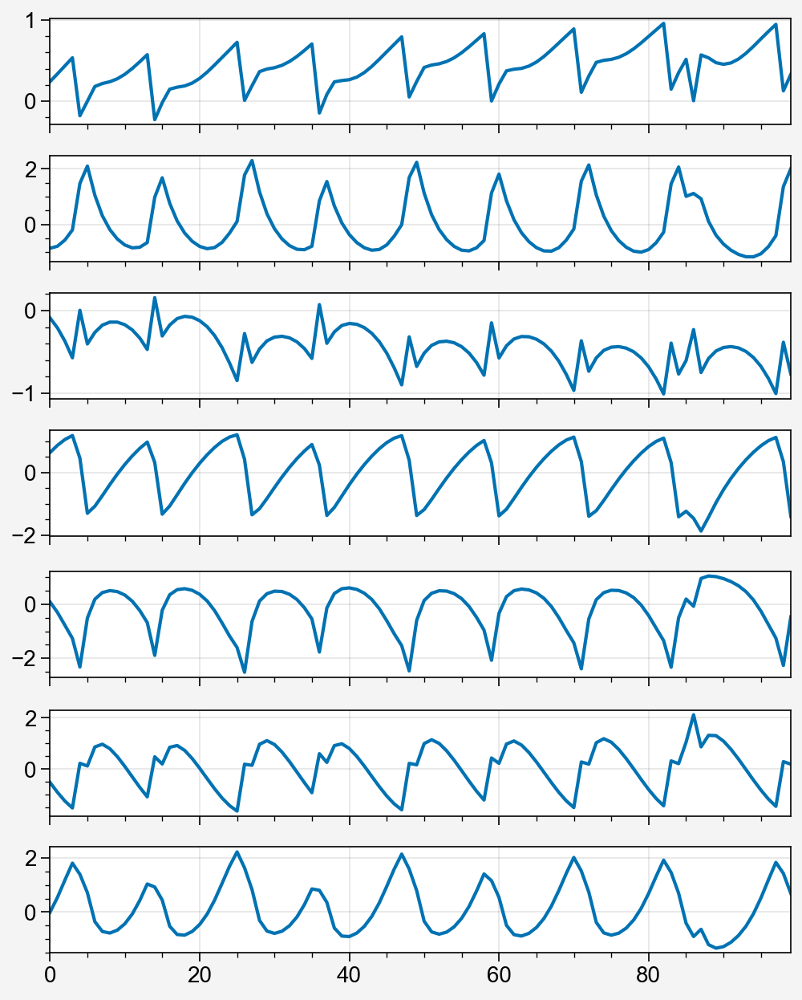

In [357]:
fig, ax = pplt.subplots(nrows=k, refaspect=7, figwidth=5)
for i in range(k):
    ax[i].plot(cluster_activ[3500:3600, i])

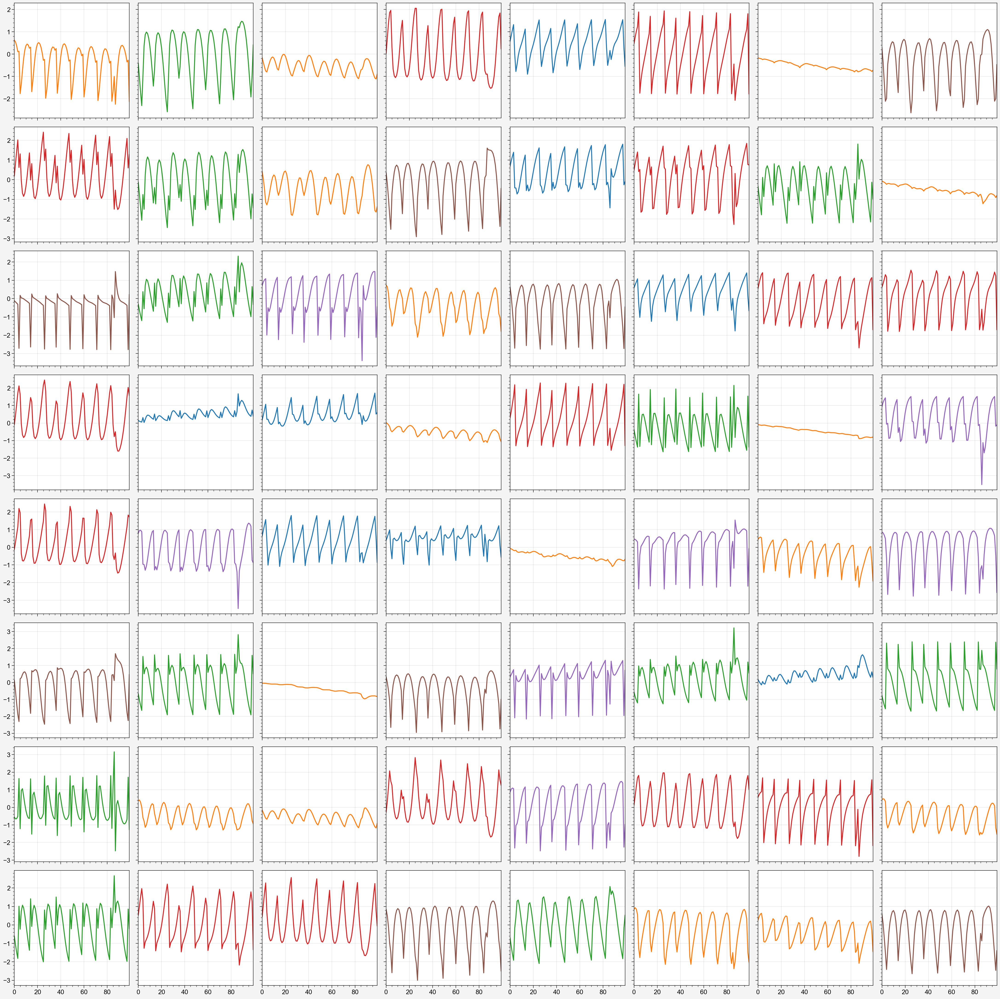

In [372]:
fig, ax = pplt.subplots(nrows=8, ncols=8)
for i in range(64):
    ax[i].plot(data_normalized[i, 3500:3600]*orientation[i], c=rgb_colors[labels[i]])

In [375]:
k, cluster_activ, labels, kmeans, orientation = kmeans_oriented_activations(r, layer='actor0')

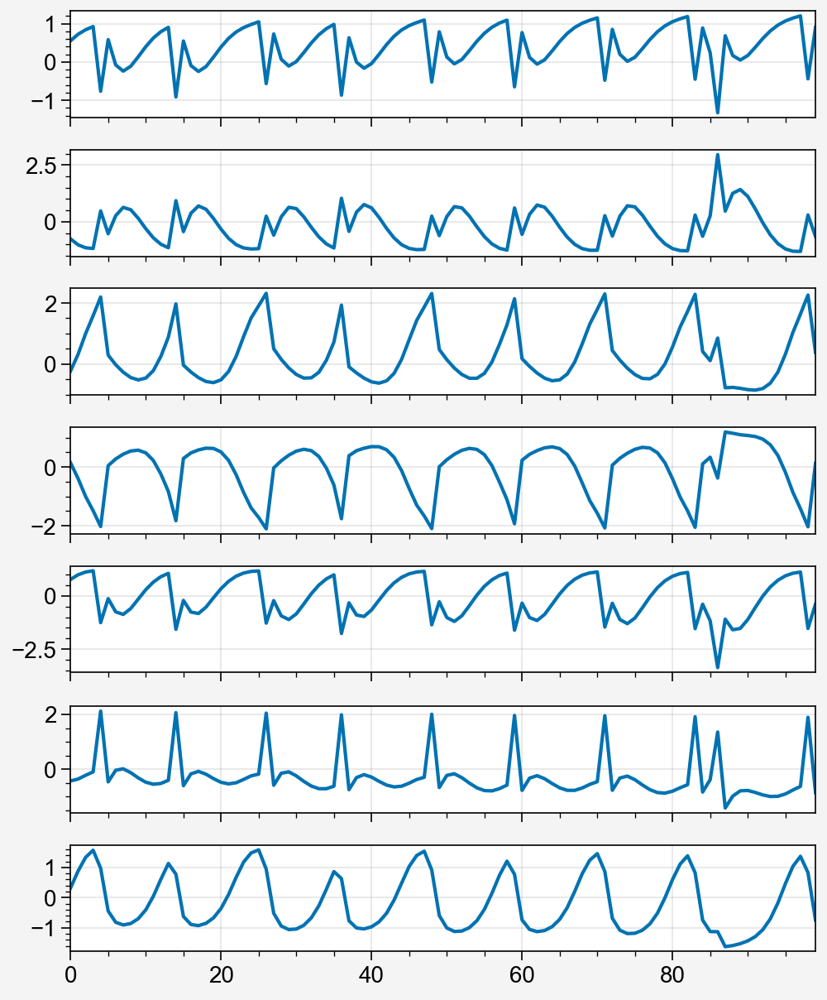

In [376]:
fig, ax = pplt.subplots(nrows=k, refaspect=7, figwidth=5)
for i in range(k):
    ax[i].plot(cluster_activ[3500:3600, i])

In [384]:
imp = get_impulsivity_data(r, layer='actor0')
activ = imp['activ']

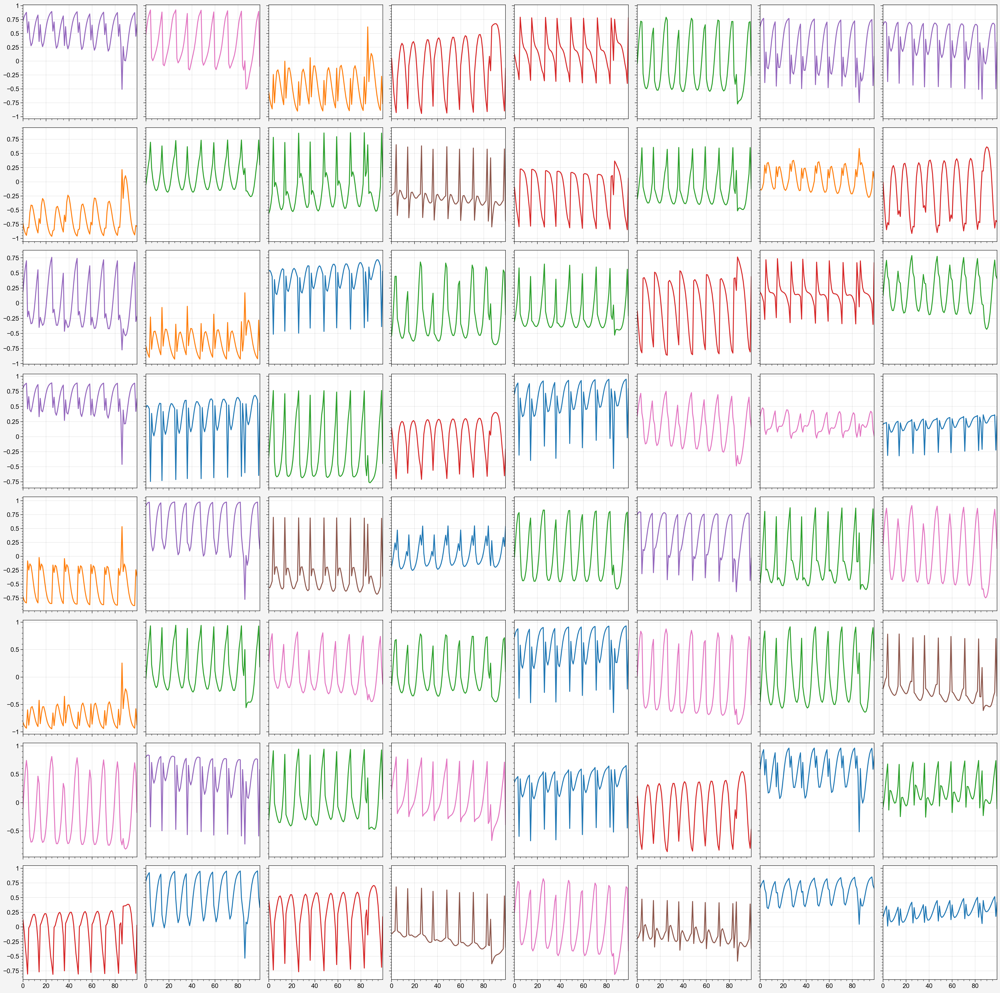

In [385]:
fig, ax = pplt.subplots(nrows=8, ncols=8)
for i in range(64):
    ax[i].plot(activ[3500:3600, i]*orientation[i], c=rgb_colors[labels[i]])

In [386]:
params = list(model.base.gru.parameters())

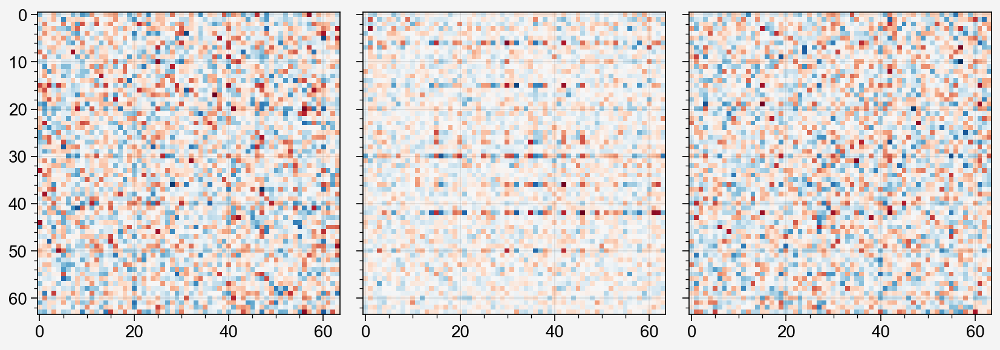

In [395]:
fig, ax = pplt.subplots(ncols=3)
for i in range(3):
    ax[i].imshow(weight_hh[i].detach())

In [399]:
labels == 0

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
        True, False, False, False, False, False, False,  True, False,
       False,  True, False, False,  True, False, False, False,  True,
       False, False, False, False, False, False, False, False,  True,
       False, False, False, False, False, False, False,  True, False,
        True, False, False,  True, False, False, False, False,  True,
        True])

In [ ]:
weight_ih, weight_hh, bias_ih, bias_hh = params
W_z, W_r, W_h = torch.split(weight_hh, 64, dim=0)

In [466]:
all_update_influence = np.zeros((k, k))
all_reset_influence = np.zeros((k, k))

for i in range(k):
    idxs = labels == i
    update_influence = np.matmul(W_z[:, idxs].detach(), activ.T[idxs])
    reset_influence = np.matmul(W_r[:, idxs].detach(), activ.T[idxs])
    for j in range(k):
        
        # receive_idxs = np.random.choice(np.arange(64), size=(labels == j).sum(), replace=False)
        # receive_idxs = np.random.choice(np.arange(64), size=15, replace=False)
        # all_update_influence[i, j] = update_influence.mean(axis=1)[receive_idxs].mean()
        # all_reset_influence[i, j] = reset_influence.mean(axis=1)[receive_idxs].mean()
        
        all_update_influence[i, j] = update_influence.mean(axis=1)[labels == j].mean()
        all_reset_influence[i, j] = reset_influence.mean(axis=1)[labels == j].mean()
        


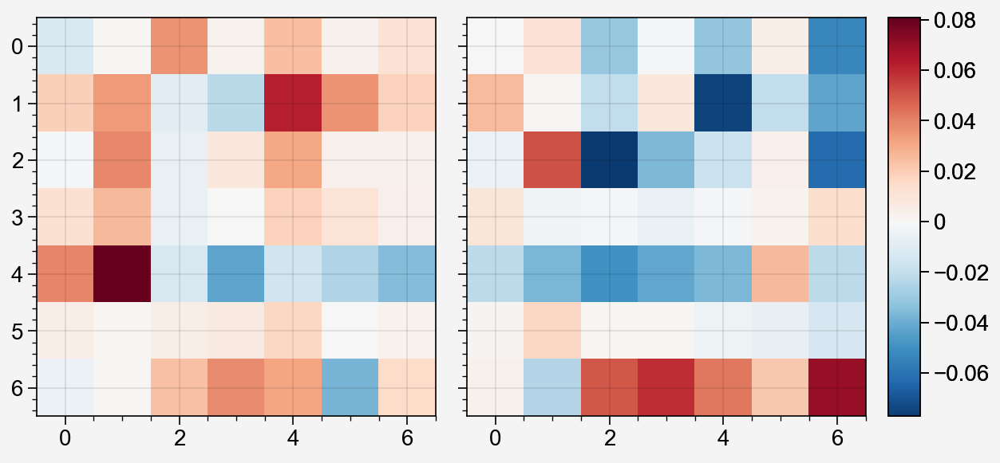

In [440]:
fig, ax = pplt.subplots(ncols=2)
vmin = min(all_update_influence.min(), all_reset_influence.min())
vmax = max(all_update_influence.max(), all_reset_influence.max())

cb = ax[0].imshow(all_update_influence, vmin=vmin, vmax=vmax)
ax[1].imshow(all_reset_influence, vmin=vmin, vmax=vmax)
fig.colorbar(cb)

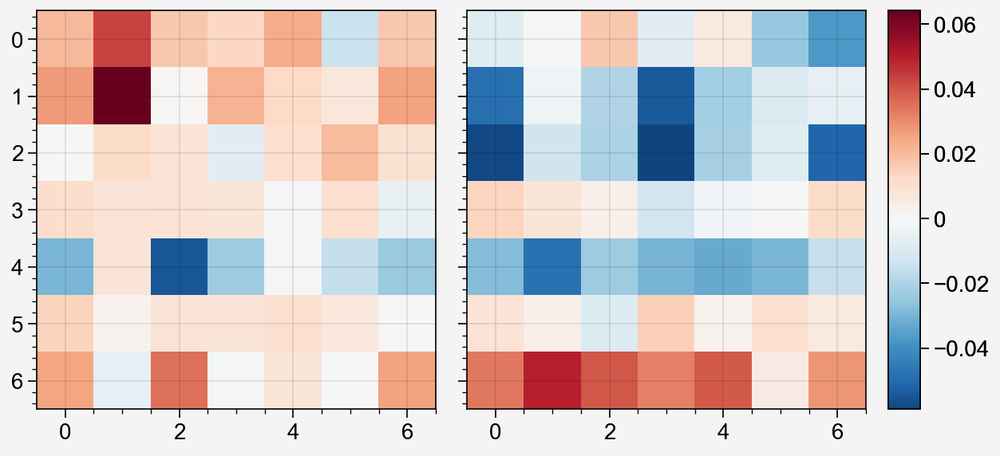

In [442]:
fig, ax = pplt.subplots(ncols=2)
vmin = min(all_update_influence.min(), all_reset_influence.min())
vmax = max(all_update_influence.max(), all_reset_influence.max())

cb = ax[0].imshow(all_update_influence, vmin=vmin, vmax=vmax)
ax[1].imshow(all_reset_influence, vmin=vmin, vmax=vmax)
fig.colorbar(cb)

In [461]:
random_runs = 1000

random_update_influence = np.zeros((k, k, random_runs))
random_reset_influence = np.zeros((k, k, random_runs))

for i in range(k):
    idxs = labels == i
    update_influence = np.matmul(W_z[:, idxs].detach(), activ.T[idxs])
    reset_influence = np.matmul(W_r[:, idxs].detach(), activ.T[idxs])
    
    for n in range(random_runs):
        for j in range(k):    
            # receive_idxs = np.random.choice(np.arange(64), size=(labels == j).sum(), replace=False)
            receive_idxs = np.random.choice(np.arange(64), size=15, replace=False)
            random_update_influence[i, j, n] = update_influence.mean(axis=1)[receive_idxs].mean()
            random_reset_influence[i, j, n] = reset_influence.mean(axis=1)[receive_idxs].mean()
        
        # all_update_influence[i, j] = update_influence.mean(axis=1)[labels == j].mean()
        # all_reset_influence[i, j] = reset_influence.mean(axis=1)[labels == j].mean()
        


In [467]:
mean_randomized_update = np.mean(random_update_influence, axis=2)
std_randomized_update = np.std(random_update_influence, axis=2)
update_z_scores = (all_update_influence - mean_randomized_update) / std_randomized_update

mean_randomized_reset = np.mean(random_reset_influence, axis=2)
std_randomized_reset = np.std(random_reset_influence, axis=2)
reset_z_scores = (all_reset_influence - mean_randomized_reset) / std_randomized_reset

(array([ 1.,  0.,  3.,  7.,  8.,  6.,  8., 11.,  3.,  2.]),
 array([-2.68323934, -2.21058203, -1.73792473, -1.26526742, -0.79261012,
        -0.31995281,  0.15270449,  0.6253618 ,  1.09801911,  1.57067641,
         2.04333372]),
 <BarContainer object of 10 artists>)

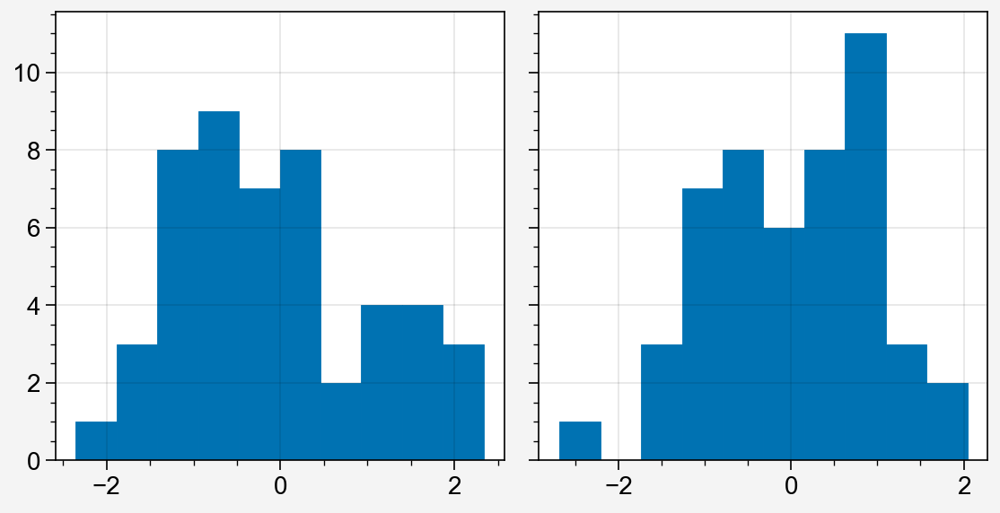

In [465]:
fig, ax = pplt.subplots(ncols=2)
ax[0].hist(update_z_scores.reshape(-1))
ax[1].hist(reset_z_scores.reshape(-1))

(array([ 1.,  2.,  4.,  7., 10.,  9., 10.,  5.,  0.,  1.]),
 array([-4.14662557, -3.30251519, -2.45840481, -1.61429443, -0.77018405,
         0.07392633,  0.91803671,  1.76214709,  2.60625747,  3.45036784,
         4.29447822]),
 <BarContainer object of 10 artists>)

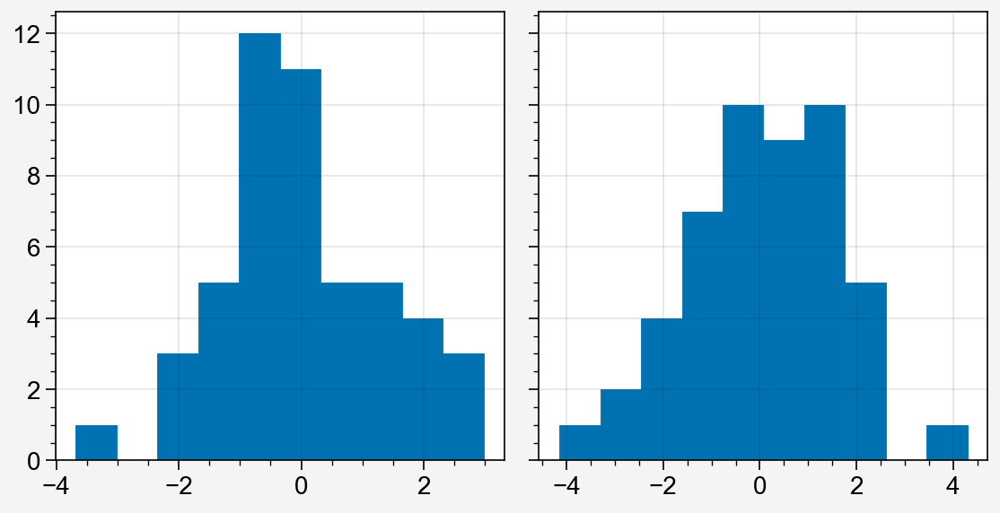

In [468]:
fig, ax = pplt.subplots(ncols=2)
ax[0].hist(update_z_scores.reshape(-1))
ax[1].hist(reset_z_scores.reshape(-1))

(array([ 1.,  0.,  3.,  5., 12., 11.,  5.,  6.,  4.,  2.]),
 array([-3.67218342, -3.00949853, -2.34681363, -1.68412873, -1.02144383,
        -0.35875893,  0.30392597,  0.96661087,  1.62929576,  2.29198066,
         2.95466556]),
 <BarContainer object of 10 artists>)

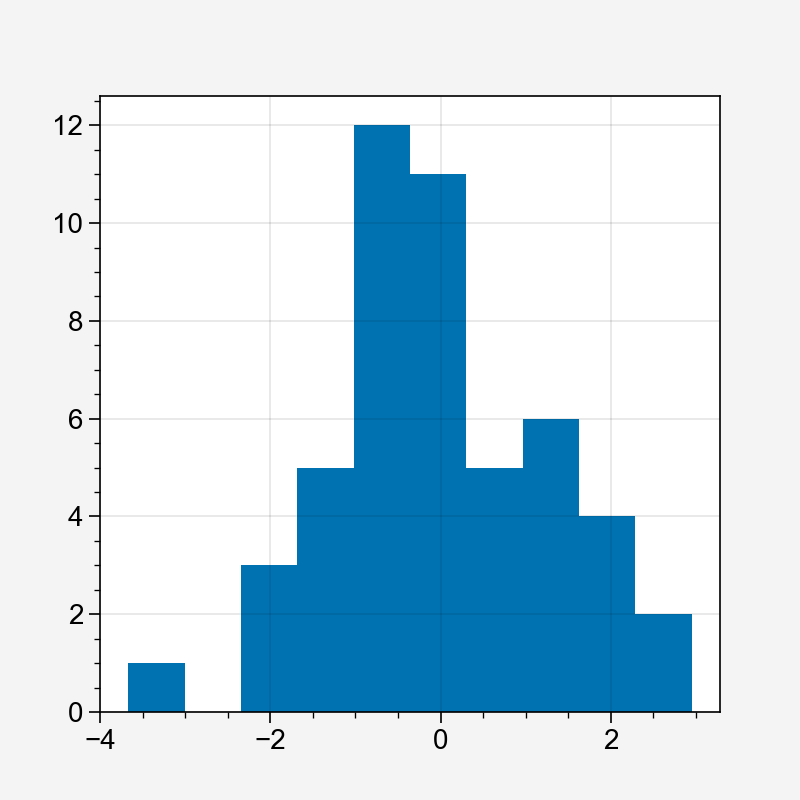

In [458]:
plt.hist(z_scores.reshape(-1))

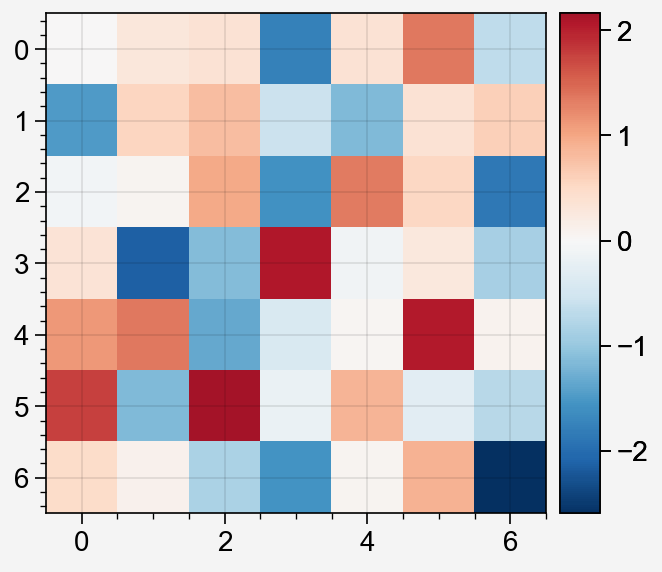

In [454]:
fig, ax = pplt.subplots()
cb = ax.imshow(z_scores)
ax.colorbar(cb)

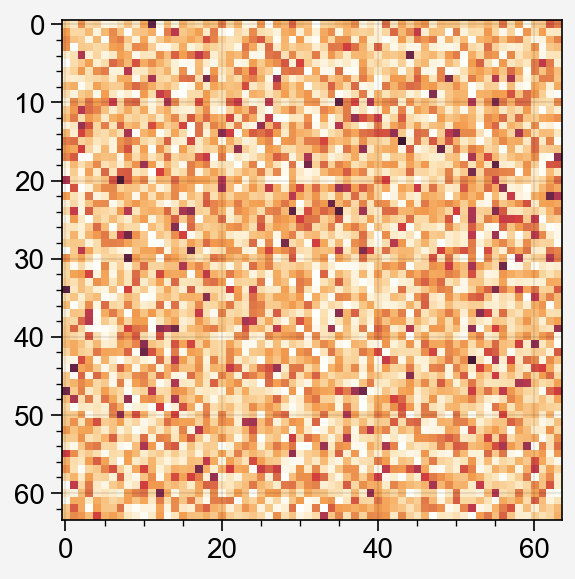

In [406]:
sorted_indices = np.argsort(labels)
sorted_weight_matrix = weight_hh[0][sorted_indices, :][:, sorted_indices]
fig, ax = pplt.subplots()
ax.imshow(np.abs(sorted_weight_matrix.detach()))

# RNN Cluster influences on actor and critic

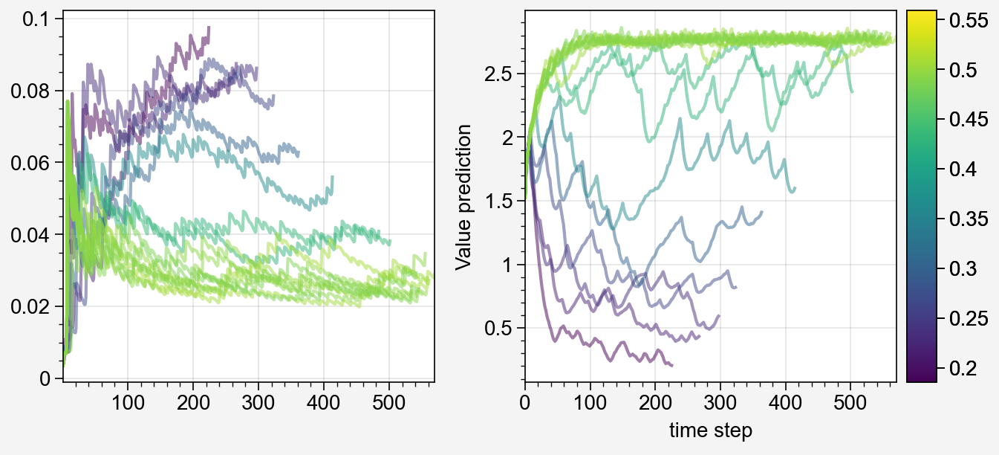

In [452]:
visualize_episode_values_from_summary(res, idx)

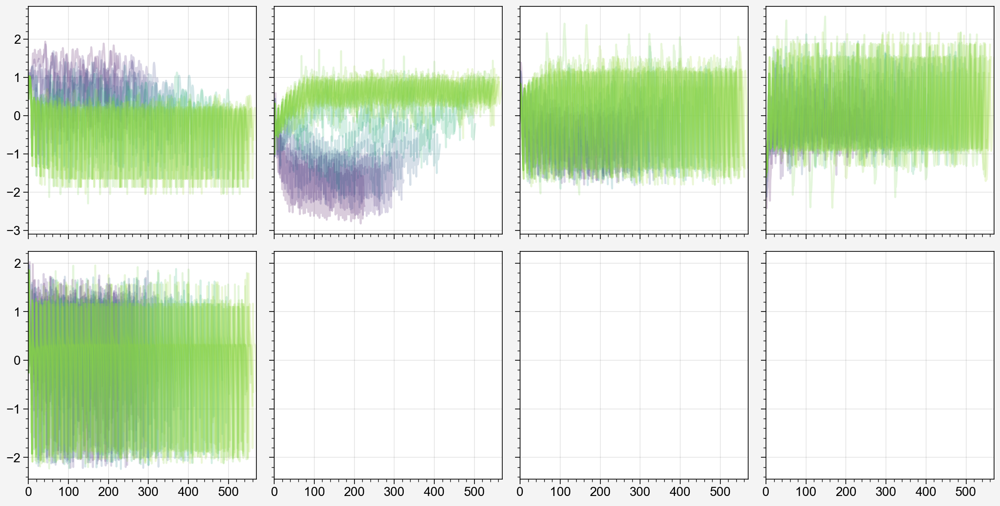

In [451]:
bsizes = get_data_from_summary(res, idx)['bsizes']
vmin = np.min(bsizes)
vmax = np.max(bsizes) + 0.05

ep_cluster_activ = split_by_ep(r, cluster_activ)

fig, ax = pplt.subplots(nrows=2, ncols=4)
for i in range(k):
    for ep in range(17):
        s = bsizes[ep]
        c = get_color_from_colormap(s, vmin, vmax, to_hex=False)
        ax[i].plot(ep_cluster_activ[ep][:, i], c=c, alpha=0.2)
        
        

## Gradient propagation

In [11]:
def cluster_grad_abs(grad_abs, labels):
    '''Given some computed gradients and cluster labels, sort the gradients
    into their clusters'''
    k = np.max(labels)+1
    clustered_grads = []
    for i in range(k):
        clustered_grads.append(grad_abs[labels == i].reshape(-1))
    return clustered_grads


def find_stable_value_eps(r):
    '''Find which episodes have "stable" value outputs throughout the episode
    Calculated based on 40% of points staying within 5% of the final value output'''
    diff_perc = []
    for ep in range(17):
        smoothed_v = pd.Series(r['values'][ep].reshape(-1)).ewm(alpha=0.1).mean()
        small_diff = ((np.abs(smoothed_v - smoothed_v.iloc[-1]) / smoothed_v.iloc[-1]) < 0.05).sum()
        diff_perc.append(small_diff / len(smoothed_v))
    diff_perc = np.array(diff_perc)
    stable_eps = np.argwhere(diff_perc >= 0.4).reshape(-1)
    unstable_eps = np.argwhere(diff_perc < 0.4).reshape(-1)
    return stable_eps, unstable_eps

    
def shuffle_arrays(*arrays):
    '''Shuffle the indexes of multiple arrays, assuming that the dimension to be shuffled
    is the first and that they have the same number of steps'''
    idxs = np.arange(len(arrays[0]))
    np.random.shuffle(idxs)
    shuffled_arrays = []
    for a in arrays:
        shuffled_arrays.append(a[idxs])
    return shuffled_arrays



def match_test_inputs(obs1, obs2, hxs1, hxs2):
    '''
    Match the number of two sets of inputs for contrastive losses
    Note that this naturally shuffles on side so contrastive comparison is between
    randomized steps
    '''
    if obs1.shape[0] >= obs2.shape[0]:
        idxs = np.random.choice(np.arange(obs2.shape[0]), obs1.shape[0])
        obs2 = obs2[idxs]
        hxs2 = hxs2[idxs]
    else:
        idxs = np.random.choice(np.arange(obs1.shape[0]), obs2.shape[0])
        obs1 = obs1[idxs]
        hxs1 = hxs1[idxs]
    
    return obs1, obs2, hxs1, hxs2
    



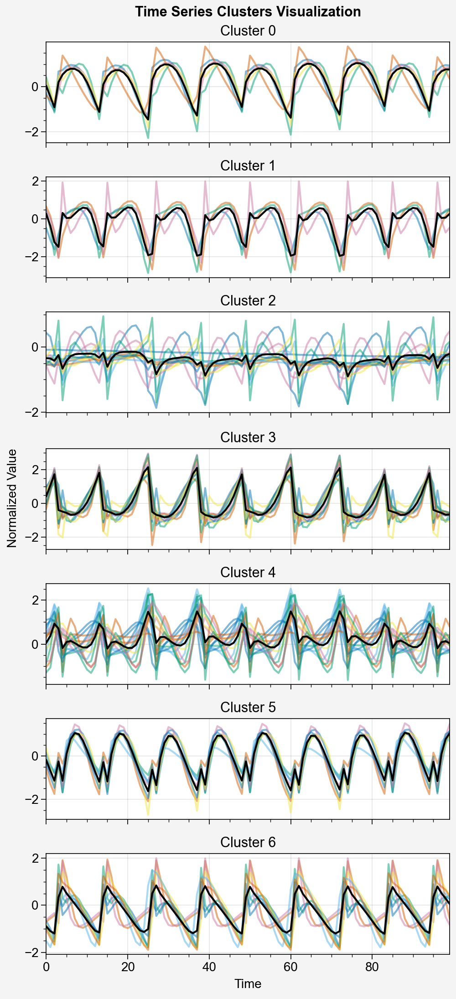

In [8]:
idx, model, obs_rms, r = select_random_model(1, load_models=True)
k, cluster_activ, labels, kmeans, orientation = kmeans_oriented_activations(r, layer='shared1')
visualize_cluster_activations(r, labels, layer='shared1', orientation=orientation, normalize=True)

In [447]:
cluster_vals = [a.mean(axis=0) for a in split_by_ep(r, cluster_activ)]
cluster_vals = np.array(cluster_vals).T

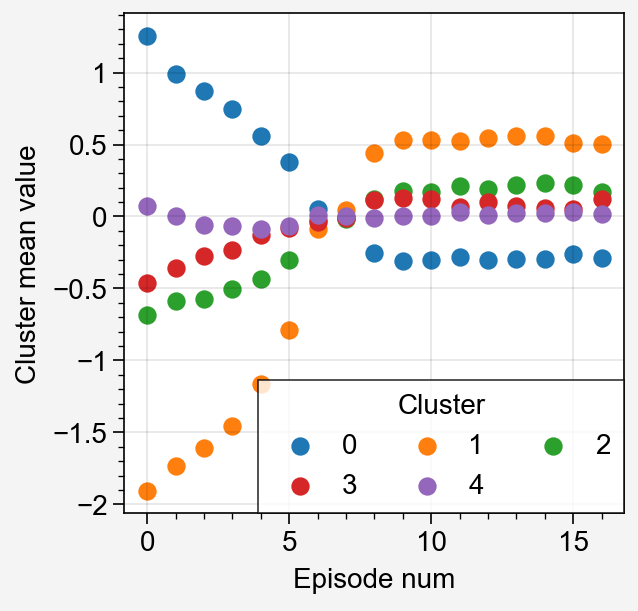

In [453]:
fig, ax = pplt.subplots()
for i in range(k):
    ax.scatter(cluster_vals[i], c=rgb_colors[i], label=f'{i}')
ax.legend(title='Cluster')
ax.format(xlabel='Episode num', ylabel='Cluster mean value')

In [9]:
all_grad_abs = []
for ep in range(17):
    model.zero_grad()
    rnn_hxs = torch.tensor(r['rnn_hxs'][ep])
    obs = torch.tensor(r['obs'][ep])
    masks = torch.tensor([1])

    outputs = model.act(obs, rnn_hxs, masks)
    outputs['value'].mean().backward()
    grad = list(model.base.critic1.parameters())[0].grad
    gradabs = np.abs(grad).mean(axis=0)
    all_grad_abs.append(gradabs)
all_grad_abs = np.array(all_grad_abs).T
all_grad_abs = all_grad_abs.mean(axis=1)

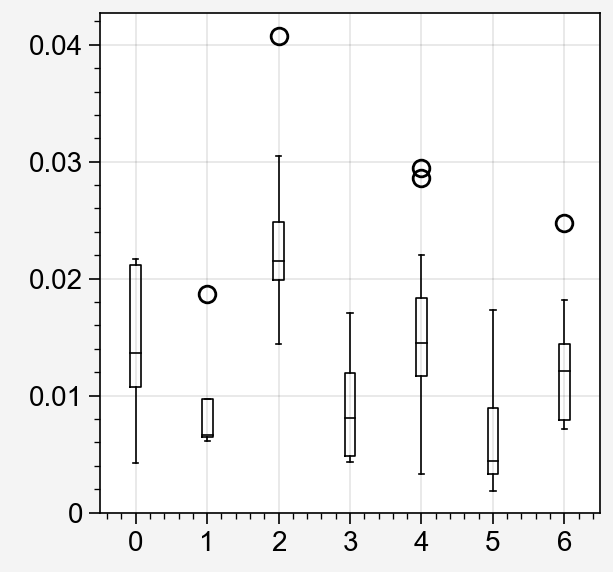

In [12]:
fig, ax = pplt.subplots()
grads = cluster_grad_abs(all_grad_abs, labels)
for i in range(len(grads)):
    ax.boxplot(i, grads[i])

In [13]:
grads = cluster_grad_abs(all_grad_abs, labels)
all_grads = all_grad_abs.reshape(-1)
for i in range(k):
    print(ttest_ind(grads[i], all_grads))

TtestResult(statistic=0.033777862073964875, pvalue=0.973154718159263, df=67.0)
TtestResult(statistic=-1.1150365615192472, pvalue=0.268878490533624, df=66.0)
TtestResult(statistic=3.7627315018727576, pvalue=0.00033134196321561835, df=75.0)
TtestResult(statistic=-2.1132947747435376, pvalue=0.037994003794344026, df=73.0)
TtestResult(statistic=0.5540852852382222, pvalue=0.5811055867756096, df=78.0)
TtestResult(statistic=-2.3107048216562758, pvalue=0.02384396001017362, df=69.0)
TtestResult(statistic=-0.4340884779365195, pvalue=0.6655592413530438, df=70.0)


In [460]:
rand_labels = np.random.permutation(labels)
grads = cluster_grad_abs(all_grad_abs, rand_labels)
all_grads = all_grad_abs.reshape(-1)
for i in range(k):
    print(ttest_ind(grads[i], all_grads))

TtestResult(statistic=-0.3612722730153596, pvalue=0.7188726444609153, df=78.0)
TtestResult(statistic=0.0402978265968915, pvalue=0.9679627681952906, df=75.0)
TtestResult(statistic=0.94201882952985, pvalue=0.34916782110546307, df=76.0)
TtestResult(statistic=-0.12848055045555237, pvalue=0.8981371120650714, df=70.0)
TtestResult(statistic=-0.6428397446575462, pvalue=0.5222885664553746, df=75.0)


In [ ]:
all_grad_abs = []
for ep in range(17):
    model.zero_grad()

    rnn_hxs = r['activations']['shared1'][ep]
    obs = torch.tensor(r['obs'][ep])
    masks = torch.tensor([1])

    outputs = model.act(obs, rnn_hxs, masks)
    outputs['value'].mean().backward()
    grad = list(model.base.critic1.parameters())[0].grad
    gradabs = np.abs(grad).mean(axis=0)
    all_grad_abs.append(gradabs)
all_grad_abs = np.array(all_grad_abs).T
all_grad_abs = all_grad_abs.mean(axis=1)

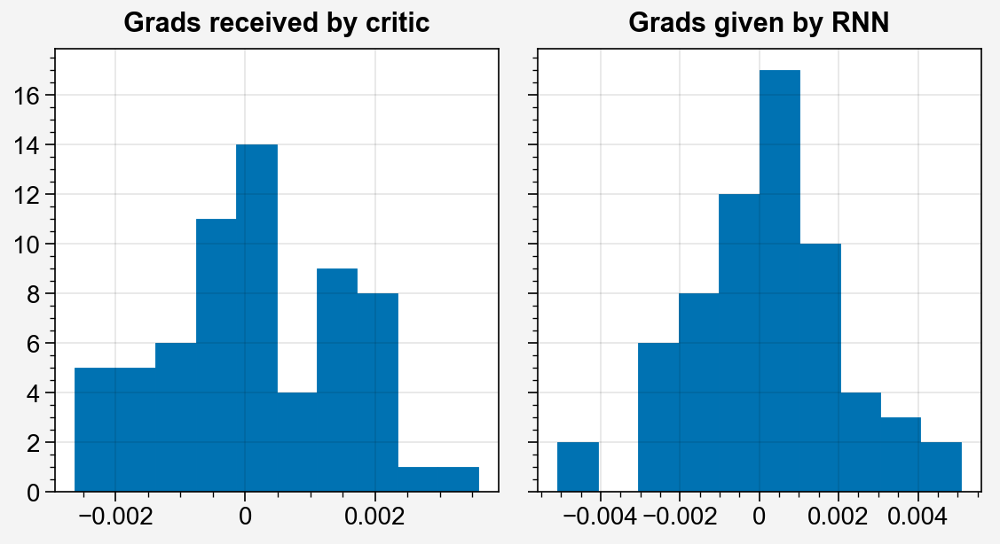

In [157]:
fig, ax = pplt.subplots(ncols=2)
ax[0].hist((grad).mean(axis=1))
ax[1].hist(grad.mean(axis=0))

ax.format(toplabels=['Grads received by critic', 'Grads given by RNN'])

(array([ 8.,  7.,  6.,  9., 10.,  9.,  5.,  2.,  4.,  4.]),
 array([8.9764462e-06, 6.9045210e-03, 1.3800066e-02, 2.0695610e-02,
        2.7591154e-02, 3.4486700e-02, 4.1382242e-02, 4.8277788e-02,
        5.5173334e-02, 6.2068876e-02, 6.8964422e-02], dtype=float32),
 <BarContainer object of 10 artists>)

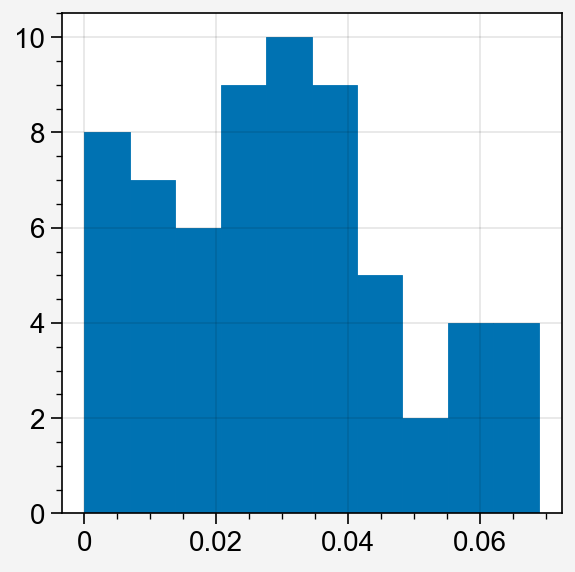

In [91]:
fig, ax = pplt.subplots()
ax.hist(np.abs(grad).mean(axis=1))

In [464]:
all_grad_abs = []
for ep in range(17):
    model.zero_grad()

    rnn_hxs = r['activations']['shared1'][ep]
    obs = torch.tensor(r['obs'][ep])
    masks = torch.tensor([1])

    outputs = model.act(obs, rnn_hxs, masks)
    outputs['value'].var().backward()
    grad = list(model.base.critic1.parameters())[0].grad
    gradabs = np.abs(grad).mean(axis=0)
    all_grad_abs.append(gradabs)
all_grad_abs = np.array(all_grad_abs).T
all_grad_abs = all_grad_abs.mean(axis=1)

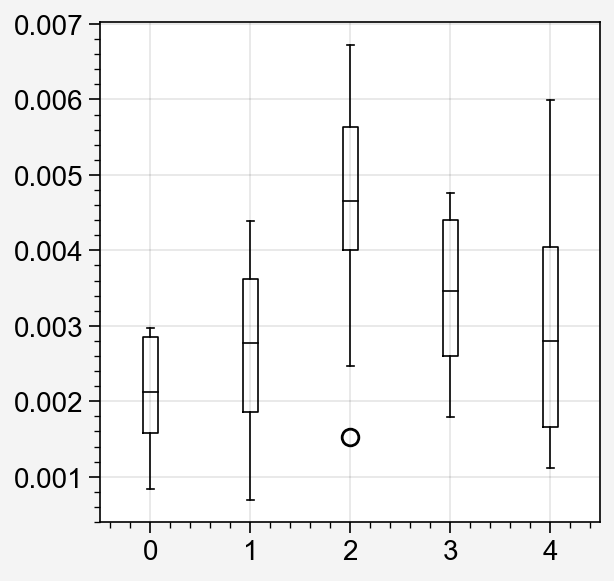

In [465]:
fig, ax = pplt.subplots()
grads = cluster_grad_abs(all_grad_abs, labels)
for i in range(len(grads)):
    ax.boxplot(i, grads[i])

In [468]:
grads = cluster_grad_abs(all_grad_abs, labels)
all_grads = all_grad_abs.reshape(-1)
for i in range(k):
    print(ttest_ind(grads[i], all_grads))

TtestResult(statistic=-2.5878191043381262, pvalue=0.011515235087741939, df=78.0)
TtestResult(statistic=-1.2163472049097563, pvalue=0.22766693364423735, df=75.0)
TtestResult(statistic=3.4266488640382557, pvalue=0.0009890702121241872, df=76.0)
TtestResult(statistic=0.5370667968589847, pvalue=0.5929245549460057, df=70.0)
TtestResult(statistic=-0.07344414418146705, pvalue=0.9416482152814805, df=75.0)


In [470]:
rand_labels = np.random.permutation(labels)
grads = cluster_grad_abs(all_grad_abs, rand_labels)
all_grads = all_grad_abs.reshape(-1)
for i in range(k):
    print(ttest_ind(grads[i], all_grads))

TtestResult(statistic=1.4084711318853562, pvalue=0.1629652894863595, df=78.0)
TtestResult(statistic=-0.25717433168928716, pvalue=0.7977484462378519, df=75.0)
TtestResult(statistic=-0.7231746801185034, pvalue=0.47179241331222055, df=76.0)
TtestResult(statistic=-0.8983167253769793, pvalue=0.37209629111390563, df=70.0)
TtestResult(statistic=0.09475463020960198, pvalue=0.9247624276670445, df=75.0)


### Contrastive value loss

Find episodes where the value is stable and high versus decreasing or lower and check contrastive loss

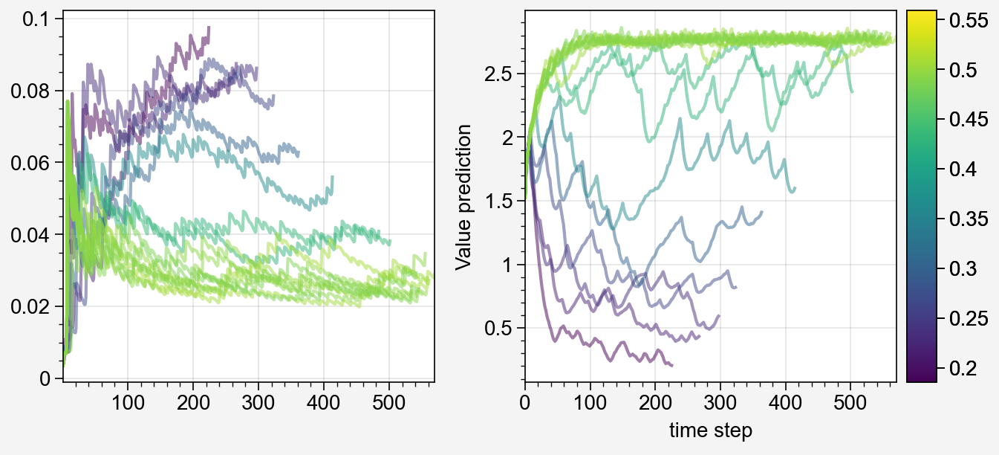

In [471]:
visualize_episode_values_from_summary(res, idx)

In [513]:
idxs = select_chks_by_dimension(h=0)
r = get_data_from_summary(res, idxs[3], use_longer_keys=True)
find_stable_value_eps(r)

(array([10, 11], dtype=int64),
 array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 12, 13, 14, 15, 16],
       dtype=int64))

In [ ]:

model_idxs, models, obs_rmss, rs = select_random_model(1, load_models=True)
idx, model, obs_rms, r = model_idxs[0], models[0], obs_rmss[0], 
visualize_cluster_activations(r, labels, layer='shared1', orientation=orientation, normalize=True)

(array([ 4,  6,  7,  8,  9, 10, 11, 13, 14, 15, 16], dtype=int64), array([ 0,  1,  2,  3,  5, 12], dtype=int64))


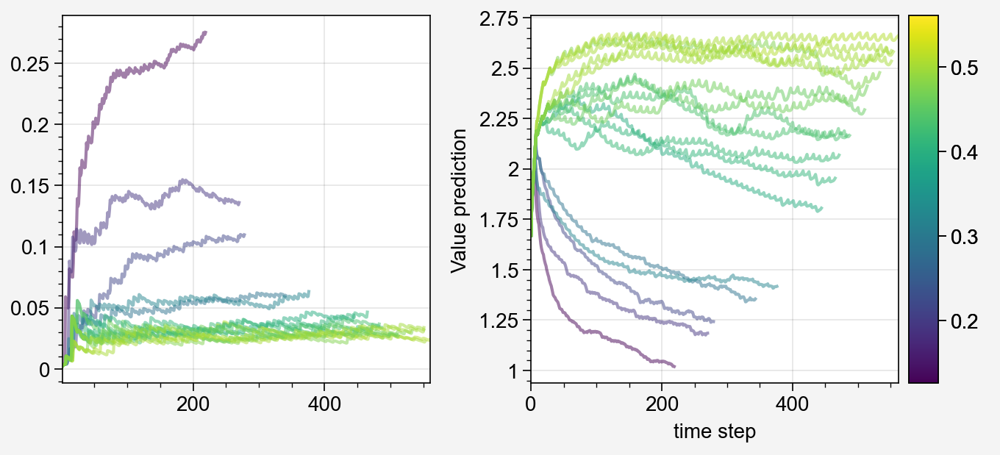

In [616]:
idx = select_random_model(1, load_models=True)
r = get_data_from_summary(res, idx, use_longer_keys=True)
print(find_stable_value_eps(r))
visualize_episode_values_from_summary(res, idx)

In [658]:
model, obs_rms = metabart_model_load(idx)
giverew = True if idx[0] == 1 else False
r = evalu(model, obs_rms, giverew)
stable_eps, unstable_eps = find_stable_value_eps(r)

eps1 = stable_eps
eps2 = unstable_eps

obs1 = []
obs2 = []
hxs1 = []
hxs2 = []

for ep in eps1:
    obs1.append(r['obs'][ep])
    # hxs1.append(r['activations']['shared1'][ep])
    hxs1.append(r['rnn_hxs'][ep])

for ep in eps2:
    obs2.append(r['obs'][ep])
    # hxs2.append(r['activations']['shared1'][ep])
    hxs2.append(r['rnn_hxs'][ep])
    
obs1 = torch.tensor(np.vstack(obs1))
obs2 = torch.tensor(np.vstack(obs2))
hxs1 = torch.tensor(np.vstack(hxs1))
hxs2 = torch.tensor(np.vstack(hxs2))

c:\Users\14and\anaconda3\envs\bart\lib\site-packages\gymnasium\core.py:311: UserWarning: WARN: env.balloon_mean_sizes to get variables from other wrappers is deprecated and will be removed in v1.0, to get this variable you can do `env.unwrapped.balloon_mean_sizes` for environment variables or `env.get_wrapper_attr('balloon_mean_sizes')` that will search the reminding wrappers.
  logger.warn(


In [659]:
obs1, obs2, hxs1, hxs2 = match_test_inputs(obs1, obs2, hxs1, hxs2)

In [596]:
out1, hxs1 = shuffle_arrays(obs1, hxs1)

In [676]:
out1, out2 = model.act(obs1, hxs1, masks), model.act(obs2, hxs2, masks)

# loss = ((out1['value'] - out2['value'])**2).mean()
# loss = out1['value'].mean()
# loss = out2['value'].mean()
loss = (out1['value'] - out2['value']).mean()
# loss = ((out1['probs'][:, 1] - out2['probs'][:, 1])**2).mean()
model.zero_grad()
loss.backward()
grad = list(model.base.critic1.parameters())[0].grad
# grad = list(model.base.actor0.parameters())[0].grad
# grad = list(model.base.gru.parameters())[0].grad
gradabs = np.abs(grad).mean(axis=0)[:64]

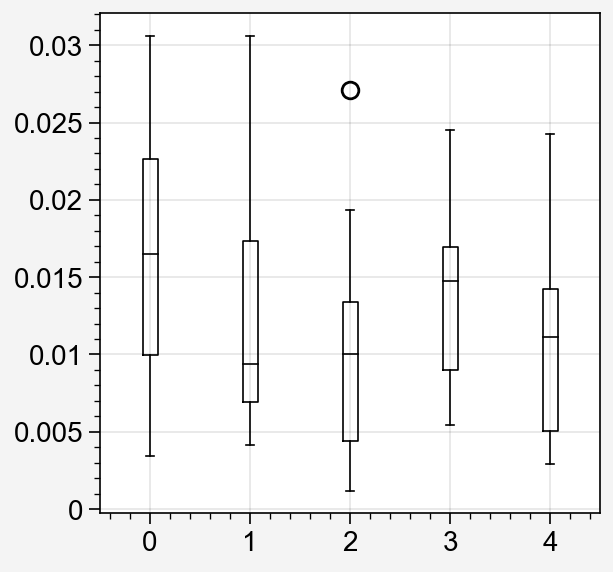

In [677]:
fig, ax = pplt.subplots()
grads = cluster_grad_abs(gradabs, labels)
for i in range(len(grads)):
    ax.boxplot(i, grads[i])

In [679]:
grads = cluster_grad_abs(gradabs, labels)
all_grads = gradabs.reshape(-1)
for i in range(k):
    print(ttest_ind(grads[i], all_grads))

TtestResult(statistic=1.782810212314782, pvalue=0.07850798599586045, df=78.0)
TtestResult(statistic=-0.06525682486891397, pvalue=0.9481431487000769, df=75.0)
TtestResult(statistic=-1.1974264032113744, pvalue=0.2348618377395449, df=76.0)
TtestResult(statistic=0.38382801576312464, pvalue=0.7022693155495052, df=70.0)
TtestResult(statistic=-1.0461331690449303, pvalue=0.2988594464233964, df=75.0)


In [678]:
rand_labels = np.random.permutation(labels)
grads = cluster_grad_abs(gradabs, rand_labels)
all_grads = gradabs.reshape(-1)
for i in range(k):
    print(ttest_ind(grads[i], all_grads))

TtestResult(statistic=-1.0932688427634996, pvalue=0.2776407610675299, df=78.0)
TtestResult(statistic=0.5235949926429102, pvalue=0.6021040189319541, df=75.0)
TtestResult(statistic=-0.5526892728063455, pvalue=0.5820981694651259, df=76.0)
TtestResult(statistic=-0.5612564468846852, pvalue=0.576415146514458, df=70.0)
TtestResult(statistic=1.6018818318628993, pvalue=0.11338555034941399, df=75.0)


## Changes by ablation

<a list of 1 Line2D objects>

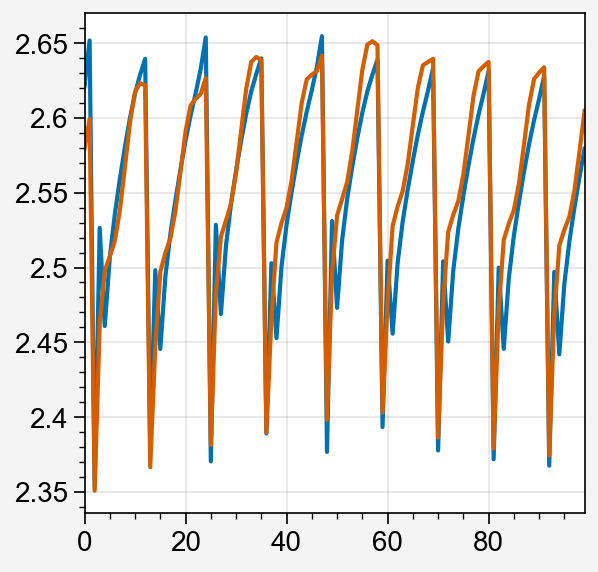

In [727]:
# rnn_hxs = r['activations']['shared1'][ep].clone()
rnn_hxs = torch.tensor(r['rnn_hxs'][ep])
obs = torch.tensor(r['obs'][ep])
masks = torch.tensor([1])
i = 1
# rnn_hxs[:, labels == i] = rnn_hxs.mean(axis=0)[labels == i]
rnn_hxs[:, labels == i] = 0

outputs = model.act(obs, rnn_hxs, masks)
basev = r['values'][ep].reshape(-1)
fig, ax = pplt.subplots()
ax.plot(outputs['value'].reshape(-1).detach()[100:200])
ax.plot(basev[100:200])

In [737]:
diffs = []

for i in range(k):
    rnn_hxs = torch.tensor(r['rnn_hxs'][ep])
    obs = torch.tensor(r['obs'][ep])
    masks = torch.tensor([1])
    # rnn_hxs[:, labels == i] = rnn_hxs.mean(axis=0)[labels == i]

    rnn_hxs[:, labels == i] -= 1
    outputs = model.act(obs, rnn_hxs, masks)
    outv = outputs['value'].reshape(-1).detach().numpy()
    basev = r['values'][ep].reshape(-1)
    # diffs.append( ((basev - outv)**2).mean() )
    diffs.append( np.abs(basev - outv).mean() )

In [738]:
diffs

[0.11927212, 0.2846284, 0.37706646, 0.21037573, 0.34201276]

<a list of 1 Line2D objects>

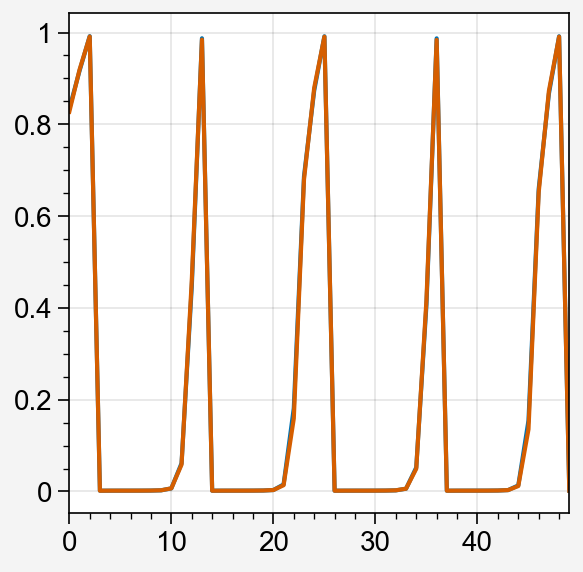

In [747]:
# rnn_hxs = r['activations']['shared1'][ep].clone()
rnn_hxs = torch.tensor(r['rnn_hxs'][ep])
obs = torch.tensor(r['obs'][ep])
masks = torch.tensor([1])
i = 0
rnn_hxs[:, labels == i] = rnn_hxs.mean(axis=0)[labels == i]
# rnn_hxs[:, labels == i] = 0

outputs = model.act(obs, rnn_hxs, masks)
ap = outputs['probs'][:, 1].detach()
basev = r['values'][ep].reshape(-1)
baseap = r['action_probs'][ep][:, 1]
fig, ax = pplt.subplots()
# ax.plot(outputs['value'].reshape(-1).detach()[100:200])
# ax.plot(basev[100:200])
ax.plot(baseap[100:150])
ax.plot(ap[100:150])

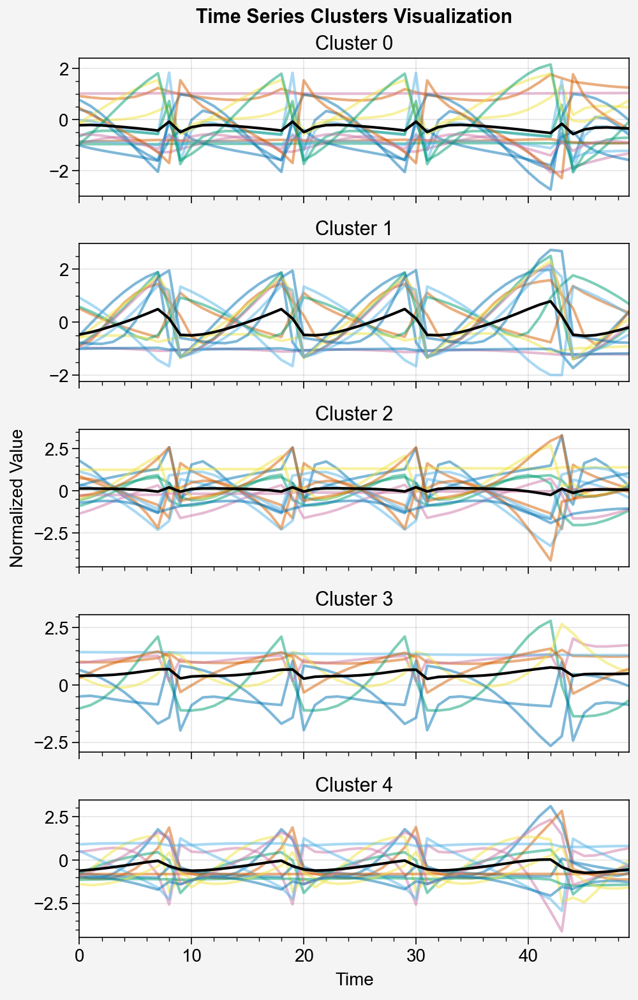

In [750]:
visualize_cluster_activations(r, labels, step1=100, step2=150)

In [749]:
all_diffs = []
for ep in range(17):
    diffs = []

    for i in range(k):
        rnn_hxs = torch.tensor(r['rnn_hxs'][ep])
        obs = torch.tensor(r['obs'][ep])
        masks = torch.tensor([1])
        rnn_hxs[:, labels == i] = rnn_hxs.mean(axis=0)[labels == i]

        outputs = model.act(obs, rnn_hxs, masks)
        outv = outputs['value'].reshape(-1).detach().numpy()
        ap = outputs['probs'][:, 1].detach().numpy()
        basev = r['values'][ep].reshape(-1)
        baseap = r['action_probs'][ep][:, 1]
        # diffs.append( np.abs(basev - outv).mean() )
        diffs.append( np.abs(baseap - ap).mean() )
    all_diffs.append(diffs)
print(np.array(all_diffs).mean(axis=0))

[0.01232445 0.07878301 0.01491026 0.00832598 0.01771956]


In [732]:
rand_labels = np.random.permutation(labels)
all_diffs = []
for ep in range(17):
    diffs = []

    for i in range(k):
        rnn_hxs = torch.tensor(r['rnn_hxs'][ep])
        obs = torch.tensor(r['obs'][ep])
        masks = torch.tensor([1])
        rnn_hxs[:, rand_labels == i] = rnn_hxs.mean(axis=0)[rand_labels == i]

        outputs = model.act(obs, rnn_hxs, masks)
        outv = outputs['value'].reshape(-1).detach().numpy()
        basev = r['values'][ep].reshape(-1)
        # diffs.append( ((basev - outv)**2).mean() )
        diffs.append( np.abs(basev - outv).mean() )
    all_diffs.append(diffs)
print(np.array(all_diffs).mean(axis=0))

[0.03428659 0.04206985 0.05490666 0.01688171 0.01914615]


In [701]:
np.array(all_diffs).mean(axis=0)

array([0.01989153, 0.0245429 , 0.04243014, 0.03040646, 0.0608393 ],
      dtype=float32)

In [ ]:
all_grad_abs = []
for ep in range(17):
    model.zero_grad()

    rnn_hxs = r['activations']['shared1'][ep]
    obs = torch.tensor(r['obs'][ep])
    masks = torch.tensor([1])

    outputs = model.act(obs, rnn_hxs, masks)
    outputs['value'].mean().backward()
    grad = list(model.base.critic1.parameters())[0].grad
    gradabs = np.abs(grad).mean(axis=0)
    all_grad_abs.append(gradabs)
all_grad_abs = np.array(all_grad_abs).T
all_grad_abs = all_grad_abs.mean(axis=1)